### Carga de Archivos

In [1]:
import random
import matplotlib.patches as mpatches
import plotly.express as px
import plotly.graph_objects as go
import statistics

from nltk.tokenize import word_tokenize
from sklearn.datasets import make_blobs
from sklearn.preprocessing import StandardScaler
from sklearn.mixture import GaussianMixture
from gensim.models import Word2Vec
from string import punctuation
from nltk.tokenize import sent_tokenize, word_tokenize

from itertools import groupby
from mpl_toolkits.mplot3d import Axes3D
from scipy import stats

In [2]:
import pandas as pd
import csv

dataset_tweet = pd.read_csv("APAUtweets.txt", header=None, delimiter = "\t", encoding = 'utf8', quoting=csv.QUOTE_NONE)
dataset_tweet.set_index(0, inplace = True)
dataset_tweet.rename(columns={1: "text"}, inplace = True)
dataset_tweet


,text
0,
0,La Gran Guerra de #JuegoDeTronos nos ha dejado...
1,El golpe de Estado en #Venezuela está más lejo...
2,No tengo una foto en la catedral de #NotreDame...
3,#NotreDame nunca llegue a visitar tan grandios...
4,A tomar por culo mi crush 😭😭😭😭😭#JuegoDeTronos
...,...
8218,"#ChampionsLeague 83’ Gooooooool de Messi, que ..."
8219,Llegarán más venezolanos y la crisis humanitar...
8220,Hoy estamos de fiesta y deberías visitarnos. #...


### Limpiar y procesar dataset

#### Convertimos a minusculas

In [3]:
import re
from string import punctuation

def preprocess_text(text):
    text = text.lower()  # Lowercase text
    text = re.sub(r"https?://\S+", "", text)
    text = re.sub(r"\b[0-9]+\b\s*", "", text)
    text = re.sub(f"[{re.escape(punctuation)}]", "", text)  # Remove punctuation
    text = " ".join(text.split())  # Remove extra spaces, tabs, and new lines
    return text


dataset_tweet["text_lower"] = dataset_tweet["text"].map(preprocess_text) # Se aplica la función preprocess_text a la columna text
dataset_tweet

,text,text_lower
0,,
0,La Gran Guerra de #JuegoDeTronos nos ha dejado...,la gran guerra de juegodetronos nos ha dejado ...
1,El golpe de Estado en #Venezuela está más lejo...,el golpe de estado en venezuela está más lejos...
2,No tengo una foto en la catedral de #NotreDame...,no tengo una foto en la catedral de notredame ...
3,#NotreDame nunca llegue a visitar tan grandios...,notredame nunca llegue a visitar tan grandiosa...
4,A tomar por culo mi crush 😭😭😭😭😭#JuegoDeTronos,a tomar por culo mi crush 😭😭😭😭😭juegodetronos
...,...,...
8218,"#ChampionsLeague 83’ Gooooooool de Messi, que ...",championsleague ’ gooooooool de messi que peda...
8219,Llegarán más venezolanos y la crisis humanitar...,llegarán más venezolanos y la crisis humanitar...
8220,Hoy estamos de fiesta y deberías visitarnos. #...,hoy estamos de fiesta y deberías visitarnos dí...


#### Borramos palabras tipicas

In [4]:
from nltk.corpus import stopwords
STOPWORDS = set(stopwords.words('spanish')) # Se obtienen las stopwords en español.

def stopwords(text):
    return " ".join([word for word in str(text).split() if word not in STOPWORDS]) # Se eliminan las stopwords de la columna text_lower


dataset_tweet["text_stopW"] = dataset_tweet["text_lower"].apply(stopwords) # Se aplica la función stopwords a la columna text_lower
dataset_tweet

,text,text_lower,text_stopW
0,,,
0,La Gran Guerra de #JuegoDeTronos nos ha dejado...,la gran guerra de juegodetronos nos ha dejado ...,gran guerra juegodetronos dejado momentos recu...
1,El golpe de Estado en #Venezuela está más lejo...,el golpe de estado en venezuela está más lejos...,golpe venezuela lejos final elif venezuelaenba...
2,No tengo una foto en la catedral de #NotreDame...,no tengo una foto en la catedral de notredame ...,foto catedral notredame secuencia hermosa
3,#NotreDame nunca llegue a visitar tan grandios...,notredame nunca llegue a visitar tan grandiosa...,notredame nunca llegue visitar tan grandiosa c...
4,A tomar por culo mi crush 😭😭😭😭😭#JuegoDeTronos,a tomar por culo mi crush 😭😭😭😭😭juegodetronos,tomar culo crush 😭😭😭😭😭juegodetronos
...,...,...,...
8218,"#ChampionsLeague 83’ Gooooooool de Messi, que ...",championsleague ’ gooooooool de messi que peda...,championsleague ’ gooooooool messi pedazo gol ...
8219,Llegarán más venezolanos y la crisis humanitar...,llegarán más venezolanos y la crisis humanitar...,llegarán venezolanos crisis humanitaria puede ...
8220,Hoy estamos de fiesta y deberías visitarnos. #...,hoy estamos de fiesta y deberías visitarnos dí...,hoy fiesta deberías visitarnos díadellibro dia...


#### Contamos palabras que más se repiten

In [5]:
#Contamos las palabras más comunes utilizadas en los tweets
from collections import Counter

cnt = Counter()
for text in dataset_tweet["text_stopW"].values:
    for word in text.split():
        cnt[word] += 1
        
cnt.most_common(15)

[('user', 2887),
 ('juegodetronos', 1189),
 ('championsleague', 1165),
 ('elecccionesgenerales28a', 1138),
 ('notredame', 1124),
 ('venezuela', 1111),
 ('diadellibro', 699),
 ('hoy', 659),
 ('gretathunberg', 610),
 ('laliga', 544),
 ('si', 540),
 ('messi', 534),
 ('mejor', 494),
 ('ver', 455),
 ('díadellibro', 428)]

#### Convertimos los emojis a texto

In [6]:
import emoji
#se convierten en texto:

def convert_emoji_to_text(emoji_text):
    text_with_aliases = emoji.demojize(emoji_text, delimiters=(":", ":"))
    return text_with_aliases


#Passing both functions to 'text_rare'
dataset_tweet['text_rare'] = dataset_tweet['text_stopW'].apply(convert_emoji_to_text)

dataset_tweet

,text,text_lower,text_stopW,text_rare
0,,,,
0,La Gran Guerra de #JuegoDeTronos nos ha dejado...,la gran guerra de juegodetronos nos ha dejado ...,gran guerra juegodetronos dejado momentos recu...,gran guerra juegodetronos dejado momentos recu...
1,El golpe de Estado en #Venezuela está más lejo...,el golpe de estado en venezuela está más lejos...,golpe venezuela lejos final elif venezuelaenba...,golpe venezuela lejos final elif venezuelaenba...
2,No tengo una foto en la catedral de #NotreDame...,no tengo una foto en la catedral de notredame ...,foto catedral notredame secuencia hermosa,foto catedral notredame secuencia hermosa
3,#NotreDame nunca llegue a visitar tan grandios...,notredame nunca llegue a visitar tan grandiosa...,notredame nunca llegue visitar tan grandiosa c...,notredame nunca llegue visitar tan grandiosa c...
4,A tomar por culo mi crush 😭😭😭😭😭#JuegoDeTronos,a tomar por culo mi crush 😭😭😭😭😭juegodetronos,tomar culo crush 😭😭😭😭😭juegodetronos,tomar culo crush :loudly_crying_face::loudly_c...
...,...,...,...,...
8218,"#ChampionsLeague 83’ Gooooooool de Messi, que ...",championsleague ’ gooooooool de messi que peda...,championsleague ’ gooooooool messi pedazo gol ...,championsleague ’ gooooooool messi pedazo gol ...
8219,Llegarán más venezolanos y la crisis humanitar...,llegarán más venezolanos y la crisis humanitar...,llegarán venezolanos crisis humanitaria puede ...,llegarán venezolanos crisis humanitaria puede ...
8220,Hoy estamos de fiesta y deberías visitarnos. #...,hoy estamos de fiesta y deberías visitarnos dí...,hoy fiesta deberías visitarnos díadellibro dia...,hoy fiesta deberías visitarnos díadellibro dia...


In [8]:
#Se eliminan los emojis de los tweets


#def erase_emoji(emoji_text):
#    texto_sin_emojis = emoji.replace_emoji(emoji_text, replace='')
#    return texto_sin_emojis



# Passing both functions to 'text_rare'
#dataset_tweet['text_rare'] = dataset_tweet['text_stopW'].apply(erase_emoji)


In [7]:
import numpy as np

# Cargar los embeddings BETO
beto_embeddings = np.loadtxt('EmoEvalEs-embeddings-BETO.txt')

# Cargar los embeddings MARIA
maria_embeddings = np.loadtxt('EmoEvalEs-embeddings-MARIA.txt')


In [9]:
assert beto_embeddings.shape[0] == len(dataset_tweet), "El número de embeddings no coincide con el número de tweets"
assert maria_embeddings.shape[0] == len(dataset_tweet), "El número de embeddings no coincide con el número de tweets"

# Se concatenan los embeddings de BETO y MARIA
combined_embeddings = np.concatenate((beto_embeddings, maria_embeddings), axis=1)
dataset_tweet["embedding_combined"] = list(combined_embeddings)
dataset_tweet.head()


,text,text_lower,text_stopW,text_rare,embedding_combined
0,,,,,
0,La Gran Guerra de #JuegoDeTronos nos ha dejado...,la gran guerra de juegodetronos nos ha dejado ...,gran guerra juegodetronos dejado momentos recu...,gran guerra juegodetronos dejado momentos recu...,"[-0.3097158372402191, 0.07352904975414276, -0...."
1,El golpe de Estado en #Venezuela está más lejo...,el golpe de estado en venezuela está más lejos...,golpe venezuela lejos final elif venezuelaenba...,golpe venezuela lejos final elif venezuelaenba...,"[-0.15729279816150665, -0.000815930834505707, ..."
2,No tengo una foto en la catedral de #NotreDame...,no tengo una foto en la catedral de notredame ...,foto catedral notredame secuencia hermosa,foto catedral notredame secuencia hermosa,"[-0.09769986569881439, 0.18906289339065552, -0..."
3,#NotreDame nunca llegue a visitar tan grandios...,notredame nunca llegue a visitar tan grandiosa...,notredame nunca llegue visitar tan grandiosa c...,notredame nunca llegue visitar tan grandiosa c...,"[0.056854553520679474, 0.053887806832790375, -..."
4,A tomar por culo mi crush 😭😭😭😭😭#JuegoDeTronos,a tomar por culo mi crush 😭😭😭😭😭juegodetronos,tomar culo crush 😭😭😭😭😭juegodetronos,tomar culo crush :loudly_crying_face::loudly_c...,"[-0.3553982675075531, 0.0061963400803506374, -..."


### World Embedding con TfidVectorizer

In [59]:
#Lo transformamos a un wordembedding
from sklearn.feature_extraction.text import TfidfVectorizer


lista_descriptiva = dataset_tweet["text_rare"]
vectorizer = TfidfVectorizer(use_idf=False, min_df=.0005)
matrix = vectorizer.fit_transform(lista_descriptiva)
matrix_text = pd.DataFrame(matrix.toarray(), columns=vectorizer.get_feature_names_out())
samples = matrix_text
samples

,15abr,15m,15marzo,15mclimatico,15mclimático,23abr,23abril,23deabril,28a,28abril,...,éxito,ícono,última,últimahora,últimas,último,últimos,única,único,únicos
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8218,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8219,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8220,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8221,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [61]:
vectorizer = TfidfVectorizer(use_idf=False)
vectorizer.fit(dataset_tweet['text_rare'])
print(f"Vocabulario generado: {len(vectorizer.vocabulary_)} términos")
print(dataset_tweet['text_rare'].apply(lambda x: re.findall(r'\b\w+\b', x)))


Vocabulario generado: 18751 términos
0
0       [gran, guerra, juegodetronos, dejado, momentos...
1       [golpe, venezuela, lejos, final, elif, venezue...
2         [foto, catedral, notredame, secuencia, hermosa]
3       [notredame, nunca, llegue, visitar, tan, grand...
4       [tomar, culo, crush, loudly_crying_face, loudl...
                              ...                        
8218    [championsleague, gooooooool, messi, pedazo, g...
8219    [llegarán, venezolanos, crisis, humanitaria, p...
8220    [hoy, fiesta, deberías, visitarnos, díadellibr...
8221    [menos, mobile_phone_with_arrow, books, libro,...
8222    [emocionado, discurso, activista, ecologista, ...
Name: text_rare, Length: 8223, dtype: object


### KMEANS sin PCA

In [13]:
#calculo kmeans del texto sin aplicar PCA
from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.metrics import silhouette_samples, silhouette_score


for i in range(2,20):
    km = KMeans(n_clusters=i, init='random', max_iter=200, random_state=0).fit(samples)
    sample_km = km.labels_
    print("cantidad de cluster:", i)
    print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(samples, sample_km))

cantidad de cluster: 2
Silhouette Coefficient: 0.025
cantidad de cluster: 3
Silhouette Coefficient: 0.033
cantidad de cluster: 4
Silhouette Coefficient: 0.040
cantidad de cluster: 5
Silhouette Coefficient: 0.044
cantidad de cluster: 6
Silhouette Coefficient: 0.052
cantidad de cluster: 7
Silhouette Coefficient: 0.055
cantidad de cluster: 8
Silhouette Coefficient: 0.056
cantidad de cluster: 9
Silhouette Coefficient: 0.053
cantidad de cluster: 10
Silhouette Coefficient: 0.059
cantidad de cluster: 11
Silhouette Coefficient: 0.059
cantidad de cluster: 12
Silhouette Coefficient: 0.056
cantidad de cluster: 13
Silhouette Coefficient: 0.046
cantidad de cluster: 14
Silhouette Coefficient: 0.053
cantidad de cluster: 15
Silhouette Coefficient: 0.040
cantidad de cluster: 16
Silhouette Coefficient: 0.040
cantidad de cluster: 17
Silhouette Coefficient: 0.038
cantidad de cluster: 18
Silhouette Coefficient: 0.034
cantidad de cluster: 19
Silhouette Coefficient: 0.034


In [20]:
# Función para interpretar clusters
def interpretar_clusters(tweets, labels):
    clusters = {}
    for cluster_id in set(labels):
        tweets_en_cluster = [tweets[i] for i in range(len(tweets)) if labels[i] == cluster_id]
        palabras_frecuentes = Counter(" ".join(tweets_en_cluster).split())
        clusters[cluster_id] = palabras_frecuentes.most_common(10)  # Top 10 palabras clave
    return clusters

# Función para asignar emociones a los clusters
def asignar_emocion(palabras_cluster, emociones_palabras):
    emocion_contador = {emocion: 0 for emocion in emociones_palabras.keys()}
    for palabra, _ in palabras_cluster:
        for emocion, palabras_asociadas in emociones_palabras.items():
            if palabra in palabras_asociadas:
                emocion_contador[emocion] += 1
    return max(emocion_contador, key=emocion_contador.get)  # Retorna la emoción predominante


### Aplicamos PCA


In [25]:
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt

def Plot2D (samples_2D, title, axes = {'x': 'x', 'y': 'y'}):

  """
  samples_2D (numpy.ndarray): array tipo embedding cuyo
        shape es (num_muestras, 2) ; 2 por las dos coordenadas

  title(string): titulo de la figura que se utiliza para el plot
  """

  df_samples_2D = pd.DataFrame(data=samples_2D, columns=[axes['x'], axes['y']])

  sns.set(font_scale=3)
  sns.set(rc={'figure.figsize':(10,10)})
  sns.relplot(data=df_samples_2D,
              x=axes['x'],
              y=axes['y'],
              height=10, legend="full", palette="bright")

  set_size_letters(title,
                   axes['x'],
                   axes['y'],
                   active_legend = False)
  plt.axis('equal')

def set_size_letters(title, x_name, y_name, title_size = 20, x_size = 18, y_size = 18, active_legend = True, legend_size = 14):

  """
  Parameters:
    title (string): titulo del plot a representar

    x_name (string): nombre del eje x

    y_name (string): nombre del eje y

    active_legend (bool): indica si mostramos la leyenda o no. Por defecto True

    x_size, y_size, legend_size: tamaño de fuente de eje x, y, leyenda

  """

  plt.title(title, fontsize=title_size)
  plt.xlabel(x_name, fontsize=x_size)
  plt.ylabel(y_name, fontsize=y_size)
  if (active_legend == True):
    plt.legend(fontsize=legend_size)



C:\Users\diego\AppData\Local\Temp\ipykernel_20944\3894962603.py:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.relplot(data=df_samples_2D,


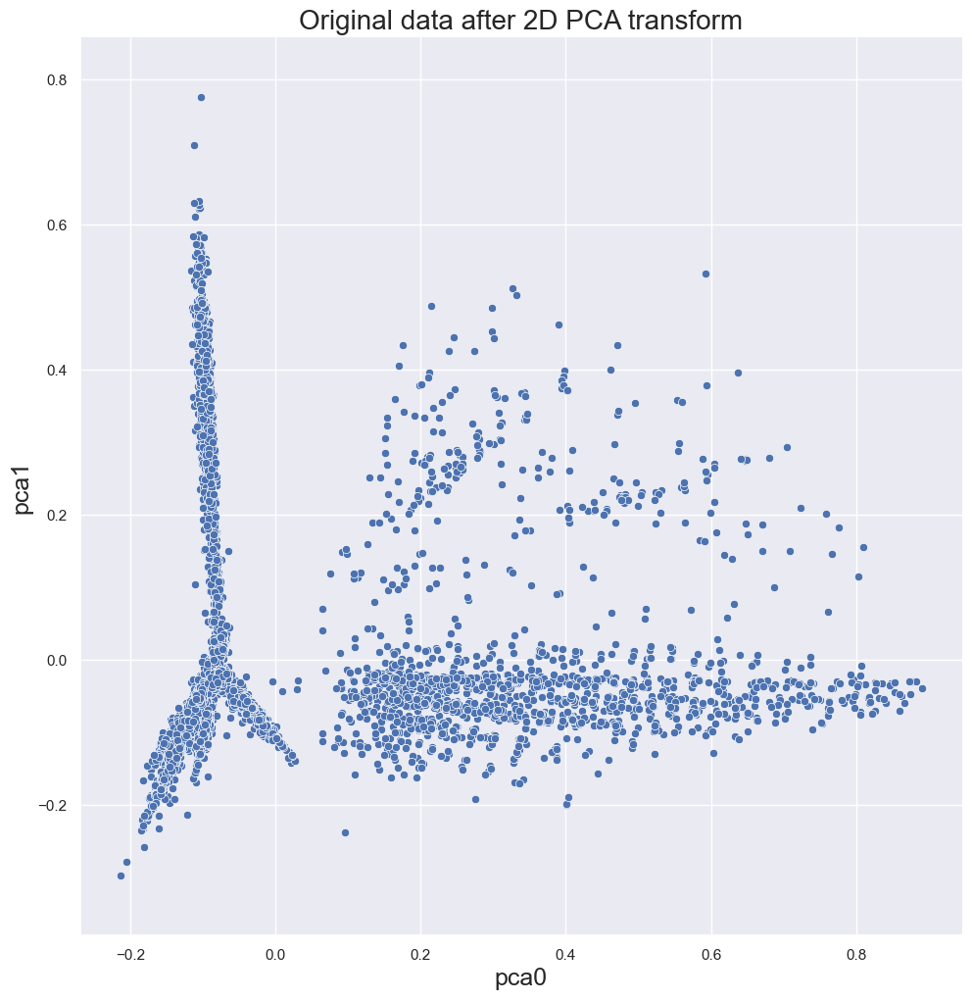

In [35]:
pca2D = PCA(2)
pca2D.fit(samples)
#Transform the data
sample_PCA_2D = pca2D.transform(samples)

df_samples_PCA_2D = pd.DataFrame(data=sample_PCA_2D, columns=["pca0", "pca1"])

title = 'Original data after 2D PCA transform'
axes_PCA_2D = {'x': 'pca0', 'y': 'pca1'}
Plot2D (sample_PCA_2D, title, axes_PCA_2D)

### Modelación de Vecinos cercanos

In [39]:
from sklearn.neighbors import NearestNeighbors
import numpy as np

def PlotDistancesToKnearestNeighbor(data_vector, K):

  """
  Parameters:
    data_vector (numpy.ndarray): array tipo embedding cuyo
        shape es (n_ejemplo,n_muestras_por_ejemplo)

    k: posición del k-esimo vecino más cercano

  """

  nbrs = NearestNeighbors(n_neighbors=K).fit(data_vector)
  distances, indices = nbrs.kneighbors(data_vector)
  distances = np.sort(distances, axis=0)
  distances = distances[:,K-1]
  plt.figure(figsize=(10,8))
  set_size_letters(f"Distancias al K-vecino más cercano (K={K})",
                   f"Points sorted according to distance of the {K}-th nearest neighbor",
                   f"{K}-th nearest neighbor distance")
  plt.plot(distances)

C:\Users\diego\AppData\Local\Temp\ipykernel_20944\3894962603.py:49: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(fontsize=legend_size)


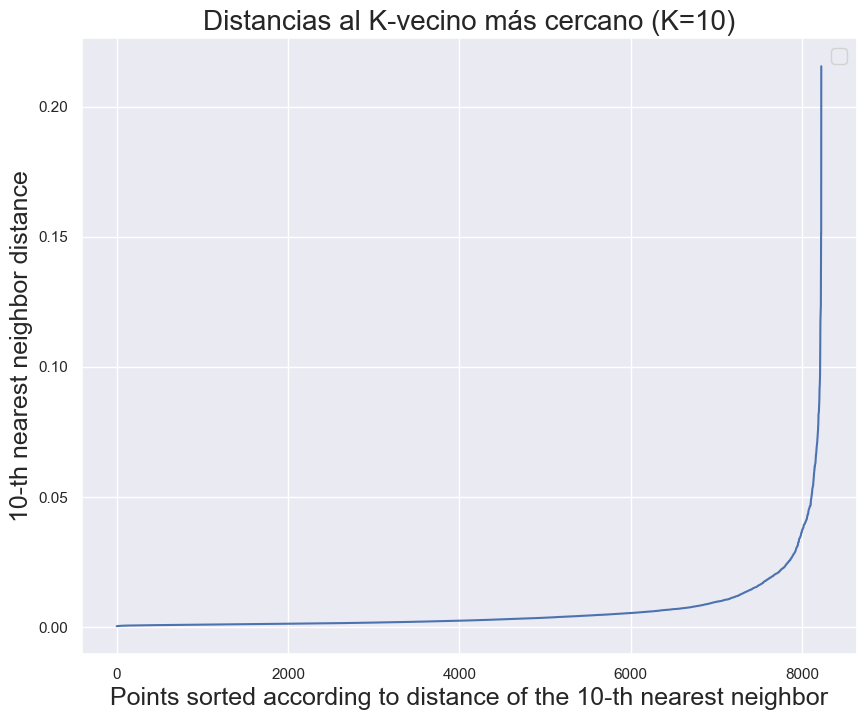

In [40]:
PlotDistancesToKnearestNeighbor(sample_PCA_2D, 10)

### Aplicamos DBSCAN a los datos

In [41]:
from sklearn.cluster import DBSCAN

def ApplyDBScanToData (samples, epsilon, min_samples = 30):

  """
  Parameters:

    samples (numpy.ndarray): array tipo embedding cuyo
        shape es (n_ejemplo,n_muestras_por_ejemplo)

    epsilon: int con el valor de epsilon (distancia mínima entre elementos
        para formar un cluster)

    min_samples (int): numero minimo de muestras para generar un cluster

    include_noise (bool): permite seleccionar si se quiere incluir el cluster
        de ruido en el cálculo de la silueta o no. Por defecto no se incluye.
        Se debe incluir cuando únicamente se detecta un cluster, para poder
        realizar la evaluación.

  Return:

    labels: lista con el cluster al que pertenece cada ejemplo de data. Cluster
        -1 significa ruido.
  """


  db = DBSCAN(eps=epsilon, min_samples=min_samples).fit(samples)

  core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
  core_samples_mask[db.core_sample_indices_] = True
  labels = db.labels_

  # Number of clusters in labels, ignoring noise if present.
  n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
  n_noise_ = list(labels).count(-1)

  print(f"\nTest for epsilon = {epsilon}")
  print('Estimated number of clusters: %d' % n_clusters_)
  print('Estimated number of noise points: %d' % n_noise_)
  print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(samples, labels))


  return labels


In [43]:
min_samples = 10
epsilon_values = [0.028, 0.03, 0.032, 0.035 , 0.037, 0.04, 0.044, 0.046, 0.05, 0.06]
aux_labels = {}
for epsilon in epsilon_values:
  aux_labels[epsilon] = ApplyDBScanToData (sample_PCA_2D, epsilon, min_samples=min_samples)

epsilon = 0.032
labels_PCA_2D = aux_labels[epsilon]


Test for epsilon = 0.028
Estimated number of clusters: 5
Estimated number of noise points: 217
Silhouette Coefficient: 0.518

Test for epsilon = 0.03
Estimated number of clusters: 5
Estimated number of noise points: 193
Silhouette Coefficient: 0.520

Test for epsilon = 0.032
Estimated number of clusters: 5
Estimated number of noise points: 187
Silhouette Coefficient: 0.521

Test for epsilon = 0.035
Estimated number of clusters: 7
Estimated number of noise points: 147
Silhouette Coefficient: 0.395

Test for epsilon = 0.037
Estimated number of clusters: 8
Estimated number of noise points: 125
Silhouette Coefficient: 0.400

Test for epsilon = 0.04
Estimated number of clusters: 6
Estimated number of noise points: 110
Silhouette Coefficient: 0.414

Test for epsilon = 0.044
Estimated number of clusters: 6
Estimated number of noise points: 90
Silhouette Coefficient: 0.402

Test for epsilon = 0.046
Estimated number of clusters: 7
Estimated number of noise points: 72
Silhouette Coefficient: 0.

### Representación del Resultado

In [44]:
def Plot2D_WithLabels (samples_2D, labels, title, axes = {'x': 'x', 'y': 'y'}, palette="bright", centroids_2D=None):

  """
  samples_2D (numpy.ndarray): array tipo embedding cuyo
        shape es (num_muestras, 2) ; 2 por las dos coordenadas

  labels (array): etiqueta perteneciente a cada muestra.

  title(string): titulo de la figura que se utiliza para el plot
  """

  # First we create the dataframe
  df_samples_2D_labeled = pd.DataFrame(data=samples_2D, columns=[axes['x'], axes['y']])

  # Then we add the labels column
  df_samples_2D_labeled['label'] = labels.tolist()

  if centroids_2D is not None:
    labels_centroid_aux = np.arange(len(centroids_2D), dtype=int)
    df_centroids_2D_labeled = pd.DataFrame(data=centroids_2D, columns=[axes['x'], axes['y']])
    df_centroids_2D_labeled['label'] = labels_centroid_aux.tolist()

  sns.set(font_scale=3)
  sns.set(rc={'figure.figsize':(10,10)})
  sns.relplot(data=df_samples_2D_labeled,
              x=axes['x'],
              y=axes['y'],
              hue="label", height=10, legend="full", palette=palette)

  if centroids_2D is not None:
    # First we plot the centroids
    sns.scatterplot(data=df_centroids_2D_labeled,
              x=axes['x'],
              y=axes['y'],
              hue="label",
              legend=False, palette=palette, s=100)

    # Then we plot their labels
    plot_2D_centroid_labels(df_centroids_2D_labeled, plt.gca())

  set_size_letters(title,
                   axes['x'],
                   axes['y'],
                   active_legend = False)
  plt.axis('equal')

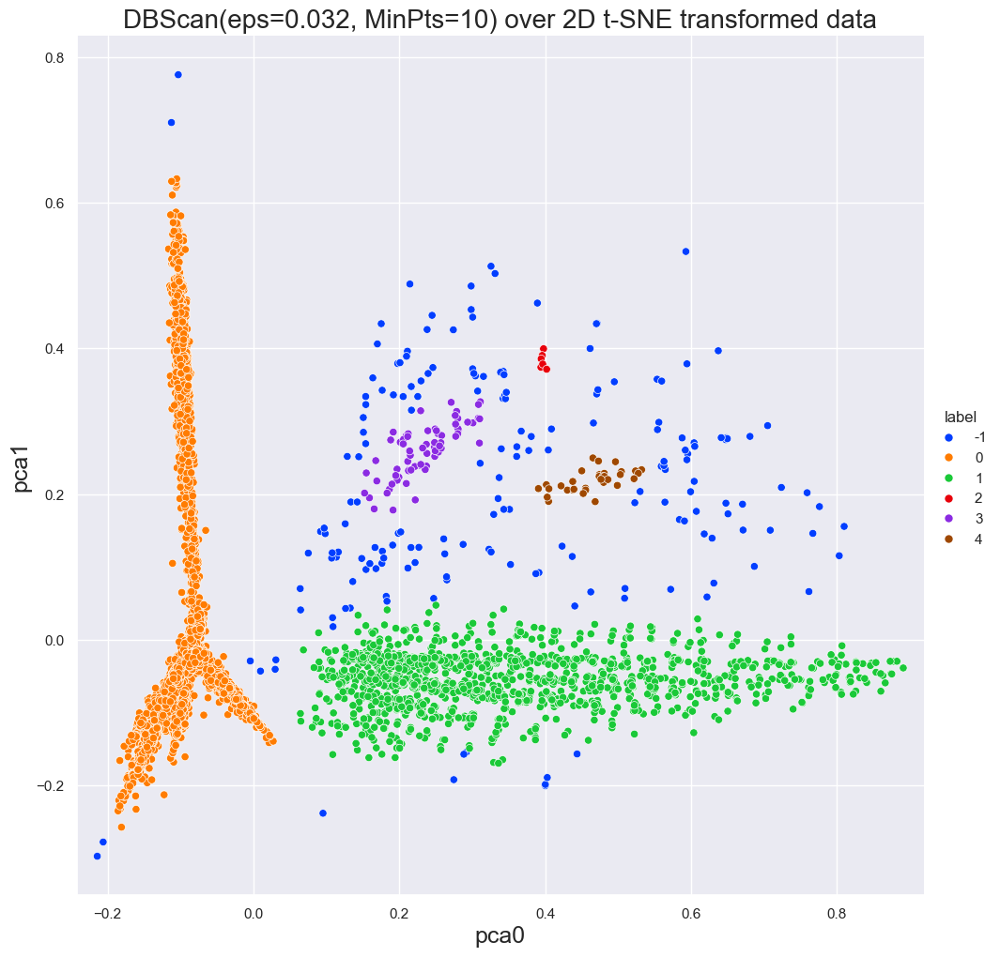

In [45]:
title = f'DBScan(eps={epsilon}, MinPts={min_samples}) over 2D t-SNE transformed data'
Plot2D_WithLabels (sample_PCA_2D, labels_PCA_2D, title, axes_PCA_2D)

In [58]:
print(dataset_tweet['text_rare'].head(10))


0
0    gran guerra juegodetronos dejado momentos recu...
1    golpe venezuela lejos final elif venezuelaenba...
2            foto catedral notredame secuencia hermosa
3    notredame nunca llegue visitar tan grandiosa c...
4    tomar culo crush :loudly_crying_face::loudly_c...
5    bueno declaro moscú nueva renovada messigrado ...
6    huelga internacional cambio climático marzo re...
7    sofia mujer rico pobre humilde 28a eldebateenr...
8    hecho hace años evitaba matar tanta gente vene...
9    :right_arrow:avance informativo :black_small_s...
Name: text_rare, dtype: object


In [55]:
dataset_tweet['cluster_DBSCAN'] = labels_PCA_2D  # etiquetas del clustering (KMeans o DBSCAN)
dataset_tweet
from sklearn.feature_extraction.text import TfidfVectorizer

def extract_keywords_from_cluster(cluster_id, dataset, column_text, top_n=10):
    # Filtrar textos del cluster
    cluster_texts = dataset[dataset['cluster_DBSCAN'] == cluster_id][column_text]
    # Vectorizar usando TF-IDF
    vectorizer = TfidfVectorizer(stop_words='english')
    tfidf_matrix = vectorizer.fit_transform(cluster_texts)
    # Sumar los pesos de TF-IDF por palabra
    tfidf_sum = tfidf_matrix.sum(axis=0)
    terms = vectorizer.get_feature_names_out()
    term_weights = [(terms[i], tfidf_sum[0, i]) for i in range(len(terms))]
    # Ordenar palabras por importancia
    keywords = sorted(term_weights, key=lambda x: x[1], reverse=True)[:top_n]
    return [word for word, weight in keywords]

def get_representative_texts(cluster_id, dataset, column_text, n=5):
    # Filtrar textos del cluster
    cluster_texts = dataset[dataset['cluster_DBSCAN'] == cluster_id]
    return cluster_texts[column_text].head(n).tolist()

for cluster_id in range(5):
    print(f"Cluster {cluster_id} ejemplos:")
    examples = get_representative_texts(cluster_id, dataset_tweet, 'text_rare')
    print('\n'.join(examples))

topic_keywords = {}
for cluster_id in range(len(set(labels_PCA_2D))):  # Ajusta según el número de clusters
    keywords = extract_keywords_from_cluster(cluster_id, dataset_tweet, 'text_rare')
    topic_keywords[cluster_id] = ', '.join(keywords[:5])  # Toma las 5 palabras más representativas

dataset_tweet['topic'] = dataset_tweet['cluster_DBSCAN'].map(lambda x: f"Cluster {x}: {topic_keywords.get(x, 'Sin tópico')}")

def Plot2D_WithTopics(samples_2D, labels, topic_keywords, title, axes={'x': 'x', 'y': 'y'}, palette="bright"):
    import matplotlib.pyplot as plt
    import seaborn as sns

    # Crear un DataFrame para los puntos y etiquetas
    df_samples_2D = pd.DataFrame(data=samples_2D, columns=[axes['x'], axes['y']])
    df_samples_2D['cluster'] = labels

    # Configuración básica
    sns.set(font_scale=1.5)
    sns.set(rc={'figure.figsize': (15, 15)})
    
    # Crear gráfico
    plt.figure(figsize=(10, 10))
    scatter = sns.scatterplot(
        data=df_samples_2D, 
        x=axes['x'], 
        y=axes['y'], 
        hue='cluster', 
        palette=palette, 
        legend="full", 
        alpha=0.7
    )

    # Añadir los tópicos como anotaciones en el centro de cada cluster
    for cluster_id, keywords in topic_keywords.items():
        cluster_points = df_samples_2D[df_samples_2D['cluster'] == cluster_id]
        if len(cluster_points) > 0:  # Evitar errores si el cluster está vacío
            centroid_x = cluster_points[axes['x']].mean()
            centroid_y = cluster_points[axes['y']].mean()
            plt.text(centroid_x, centroid_y, f"Cluster {cluster_id}:\n{keywords}", 
                     fontsize=12, color='black', weight='bold',
                     bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))

    plt.title(title, fontsize=20)
    plt.axis("equal")
    plt.show()



Cluster 0 ejemplos:
gran guerra juegodetronos dejado momentos recuerdo unas cuantas dudas
golpe venezuela lejos final elif venezuelaenbatallayvictoria venezuelanoserinde venezuelahoy
foto catedral notredame secuencia hermosa
notredame nunca llegue visitar tan grandiosa construcción solo vista imágenes videos :loudly_crying_face:
tomar culo crush :loudly_crying_face::loudly_crying_face::loudly_crying_face::loudly_crying_face::loudly_crying_face:juegodetronos
Cluster 1 ejemplos:
:right_arrow:avance informativo :black_small_square:valoraciones resultados elecccionesgenerales28a :black_small_square:constitución federación regional regentes horas user user :radio:
mirad hecho user edit juegodetronos gilipollez gusta
user user user user user gobierno españa hace llamamiento celebren inmediatamente elecciones democráticas venezuela aún tiempo evitar derramamiento sangre
venezuela escalación violencia ejercito seguidores user suficiente apoyo fuerzas armadas madurosin fragmentar poderes fáctic

ValueError: empty vocabulary; perhaps the documents only contain stop words

### Aplicamos KMEANS

In [21]:
#calculo kmeans del texto con aplicar PCA
clusters =[2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
silhouette_avg = []


for i in clusters:
    km = KMeans(n_clusters=i, init='random', max_iter=200, random_state=0).fit(sample_PCA_2D)
    sample_km_pca_2d = km.labels_
    
    score = silhouette_score(sample_PCA_2D, km.labels_)
    silhouette_avg.append(score)
    
    print("cantidad de cluster:", i)
    print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(sample_PCA_2D, sample_km_pca_2d))

#3 clusters - 0.722

cantidad de cluster: 2
Silhouette Coefficient: 0.627
cantidad de cluster: 3
Silhouette Coefficient: 0.713
cantidad de cluster: 4
Silhouette Coefficient: 0.703
cantidad de cluster: 5
Silhouette Coefficient: 0.502
cantidad de cluster: 6
Silhouette Coefficient: 0.520
cantidad de cluster: 7
Silhouette Coefficient: 0.463
cantidad de cluster: 8
Silhouette Coefficient: 0.516
cantidad de cluster: 9
Silhouette Coefficient: 0.509
cantidad de cluster: 10
Silhouette Coefficient: 0.510
cantidad de cluster: 11
Silhouette Coefficient: 0.520
cantidad de cluster: 12
Silhouette Coefficient: 0.509
cantidad de cluster: 13
Silhouette Coefficient: 0.504
cantidad de cluster: 14
Silhouette Coefficient: 0.503
cantidad de cluster: 15
Silhouette Coefficient: 0.499
cantidad de cluster: 16
Silhouette Coefficient: 0.507
cantidad de cluster: 17
Silhouette Coefficient: 0.466
cantidad de cluster: 18
Silhouette Coefficient: 0.488
cantidad de cluster: 19
Silhouette Coefficient: 0.503
cantidad de cluster: 20
Silhouette C

### Grafico KMEANS

In [22]:
def plot_2D_centroid_labels(df_centroids, ax):
    for index, row in df_centroids.iterrows():
      ax.text(row[0]+.5, row[1], 'C'+str(row[2].astype(int)), fontsize = 20, color='black', weight='semibold')

C:\Users\diego\AppData\Local\Temp\ipykernel_22264\1793276746.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.text(row[0]+.5, row[1], 'C'+str(row[2].astype(int)), fontsize = 20, color='black', weight='semibold')


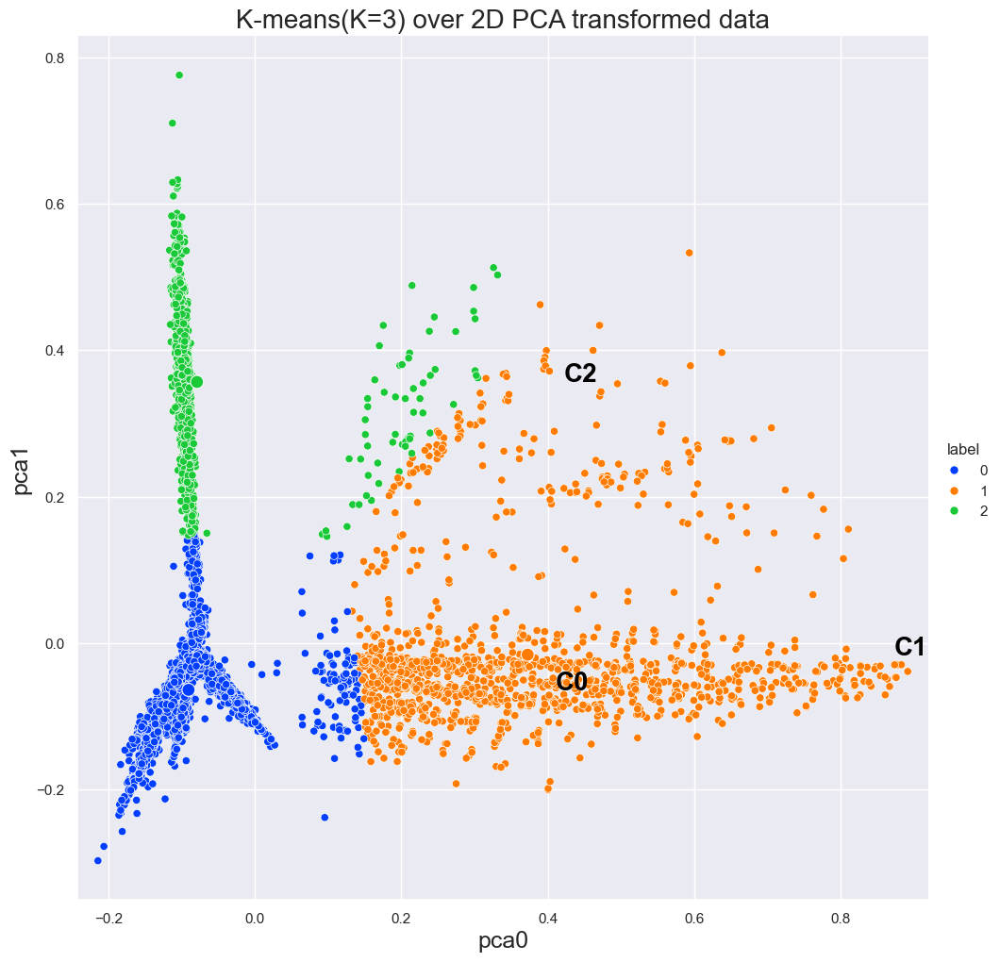

In [23]:
n_clusters = clusters[pd.Series(silhouette_avg).idxmax()]
kmeans = KMeans(n_clusters=n_clusters)
label = kmeans.fit_predict(sample_PCA_2D)

axes_PCA = {'x': 'pca0', 'y': 'pca1'}
title = f'K-means(K={n_clusters}) over 2D PCA transformed data'
plot = Plot2D_WithLabels(sample_PCA_2D, kmeans.labels_, title, axes_PCA, centroids_2D=kmeans.cluster_centers_)

### Reducción por TSNE 2D

#### Creación del modelo

In [24]:
from sklearn.manifold import TSNE


In [25]:
tsne2D = TSNE(n_components=2)
samples_TSNE_2D = tsne2D.fit_transform(samples)
df_samples_TSNE_2D = pd.DataFrame(data=samples_TSNE_2D, columns=["tsne0", "tsne1"])

#### Representación Visual del Modelo

C:\Users\diego\AppData\Local\Temp\ipykernel_22264\3894962603.py:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.relplot(data=df_samples_2D,


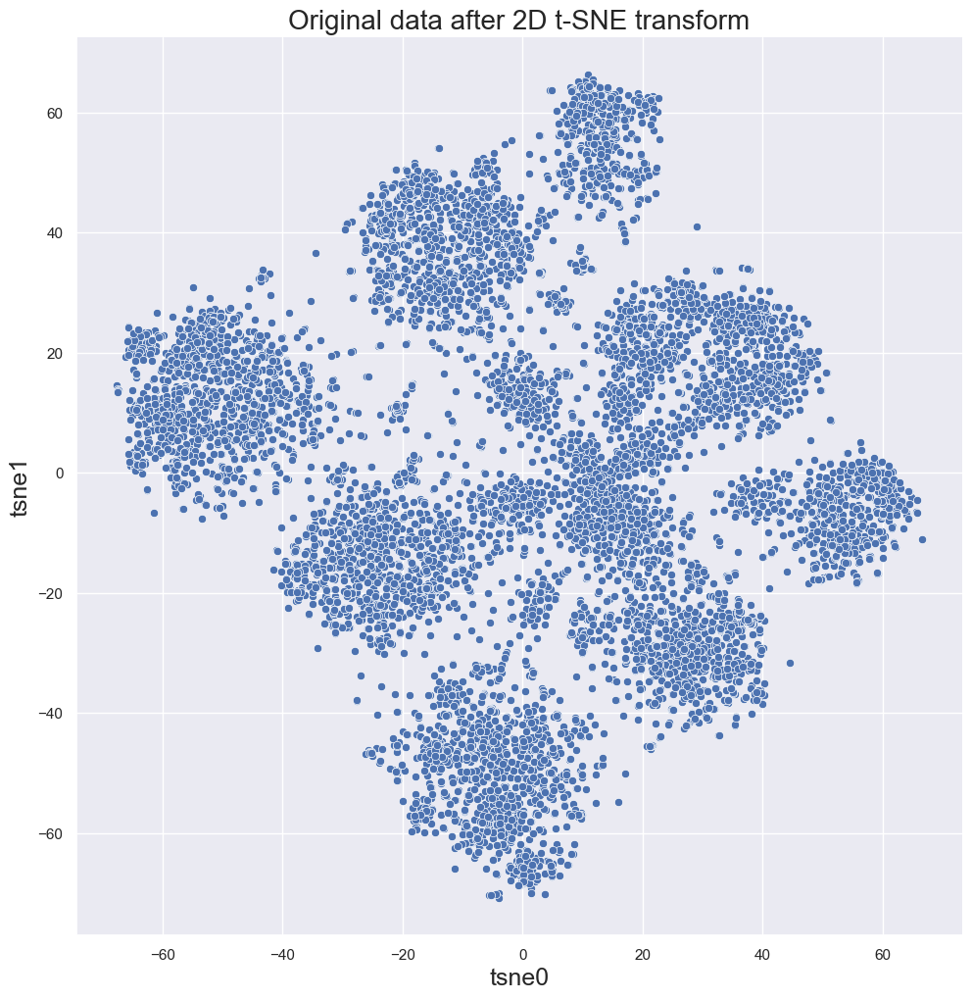

In [26]:
title = 'Original data after 2D t-SNE transform'
axes_TSNE_2D = {'x': 'tsne0', 'y': 'tsne1'}
Plot2D (samples_TSNE_2D, title, axes_TSNE_2D)

## Modelación KnearestNeighbor TSNE 2D

C:\Users\diego\AppData\Local\Temp\ipykernel_22264\3894962603.py:49: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(fontsize=legend_size)


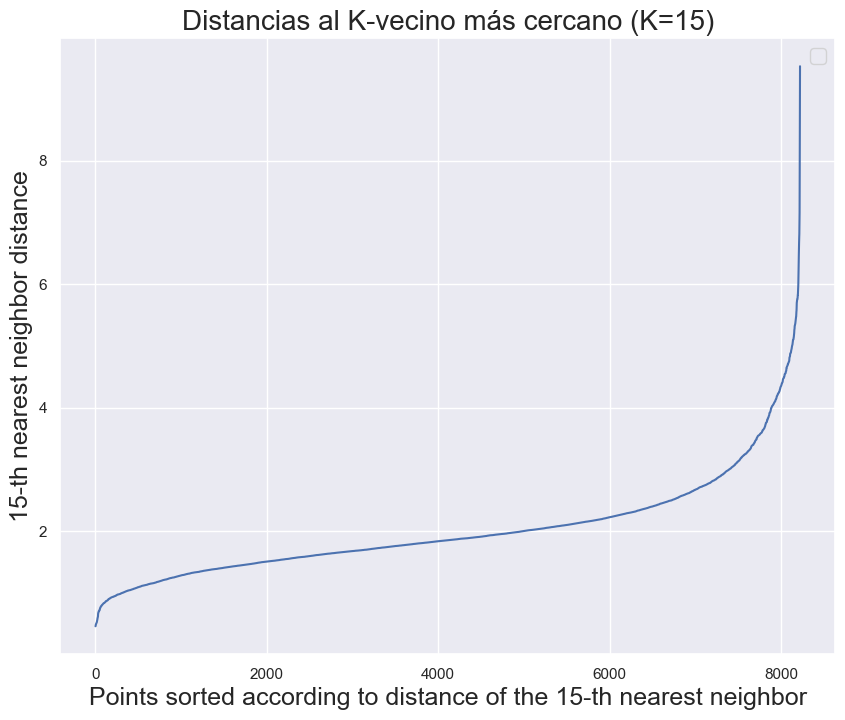

In [27]:
PlotDistancesToKnearestNeighbor(samples_TSNE_2D, 15)

### Aplicar KMeans

In [28]:
#calculo kmeans del texto con aplicar PCA
clusters =[2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
silhouette_avg = []


for i in clusters:
    km = KMeans(n_clusters=i, init='random', max_iter=200, random_state=0).fit(samples_TSNE_2D)
    sample_km_pca_2d = km.labels_
    
    score = silhouette_score(samples_TSNE_2D, km.labels_)
    silhouette_avg.append(score)
    
    print("cantidad de cluster:", i)
    print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(samples_TSNE_2D, sample_km_pca_2d))

cantidad de cluster: 2
Silhouette Coefficient: 0.370
cantidad de cluster: 3
Silhouette Coefficient: 0.388
cantidad de cluster: 4
Silhouette Coefficient: 0.422
cantidad de cluster: 5
Silhouette Coefficient: 0.437
cantidad de cluster: 6
Silhouette Coefficient: 0.456
cantidad de cluster: 7
Silhouette Coefficient: 0.474
cantidad de cluster: 8
Silhouette Coefficient: 0.488
cantidad de cluster: 9
Silhouette Coefficient: 0.510
cantidad de cluster: 10
Silhouette Coefficient: 0.505
cantidad de cluster: 11
Silhouette Coefficient: 0.500
cantidad de cluster: 12
Silhouette Coefficient: 0.473
cantidad de cluster: 13
Silhouette Coefficient: 0.467
cantidad de cluster: 14
Silhouette Coefficient: 0.448
cantidad de cluster: 15
Silhouette Coefficient: 0.438
cantidad de cluster: 16
Silhouette Coefficient: 0.425
cantidad de cluster: 17
Silhouette Coefficient: 0.414
cantidad de cluster: 18
Silhouette Coefficient: 0.404
cantidad de cluster: 19
Silhouette Coefficient: 0.396
cantidad de cluster: 20
Silhouette C

## Graficamos KMeans

C:\Users\diego\AppData\Local\Temp\ipykernel_22264\1793276746.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.text(row[0]+.5, row[1], 'C'+str(row[2].astype(int)), fontsize = 20, color='black', weight='semibold')


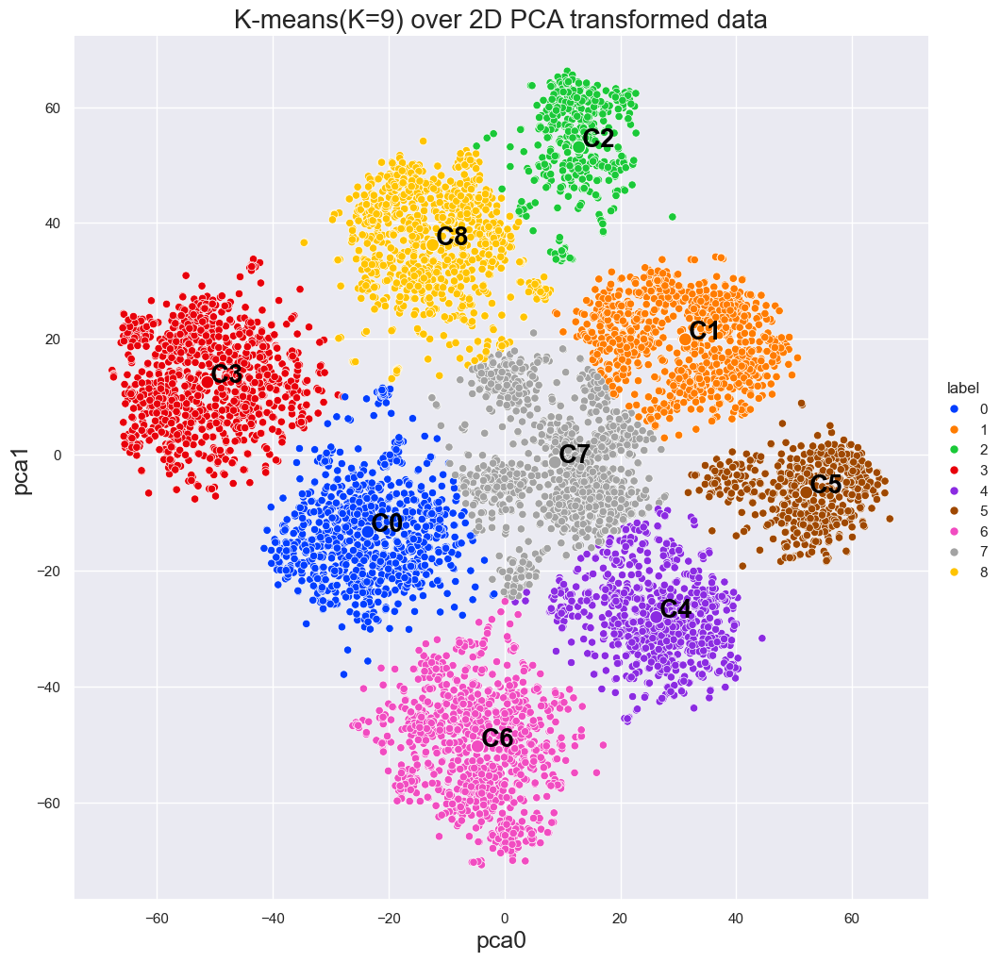

In [29]:
n_clusters = clusters[pd.Series(silhouette_avg).idxmax()]
kmeans = KMeans(n_clusters=n_clusters)
label = kmeans.fit_predict(samples_TSNE_2D)

axes_PCA = {'x': 'pca0', 'y': 'pca1'}
title = f'K-means(K={n_clusters}) over 2D PCA transformed data'
plot = Plot2D_WithLabels(samples_TSNE_2D, kmeans.labels_, title, axes_PCA, centroids_2D=kmeans.cluster_centers_)

### Aplicar DBScan

In [30]:
min_samples = 20
epsilon_values = [3.2, 3.4, 3.6, 3.8, 3.9, 4, 4.05, 4.055,4.1, 4.3, 4.5, 4.7, 4.9]
aux_labels = {}

for epsilon in epsilon_values:
  aux_labels[epsilon] = ApplyDBScanToData (samples_TSNE_2D, epsilon, min_samples=min_samples)


Test for epsilon = 3.2
Estimated number of clusters: 12
Estimated number of noise points: 330
Silhouette Coefficient: -0.011

Test for epsilon = 3.4
Estimated number of clusters: 11
Estimated number of noise points: 208
Silhouette Coefficient: 0.026

Test for epsilon = 3.6
Estimated number of clusters: 11
Estimated number of noise points: 160
Silhouette Coefficient: 0.029

Test for epsilon = 3.8
Estimated number of clusters: 9
Estimated number of noise points: 122
Silhouette Coefficient: -0.077

Test for epsilon = 3.9
Estimated number of clusters: 9
Estimated number of noise points: 102
Silhouette Coefficient: -0.075

Test for epsilon = 4
Estimated number of clusters: 7
Estimated number of noise points: 96
Silhouette Coefficient: -0.066

Test for epsilon = 4.05
Estimated number of clusters: 6
Estimated number of noise points: 91
Silhouette Coefficient: 0.018

Test for epsilon = 4.055
Estimated number of clusters: 6
Estimated number of noise points: 91
Silhouette Coefficient: 0.018

Te

In [31]:
epsilon = 3.4
labels_TSNE_2D = aux_labels[epsilon]

### Representación del resultado

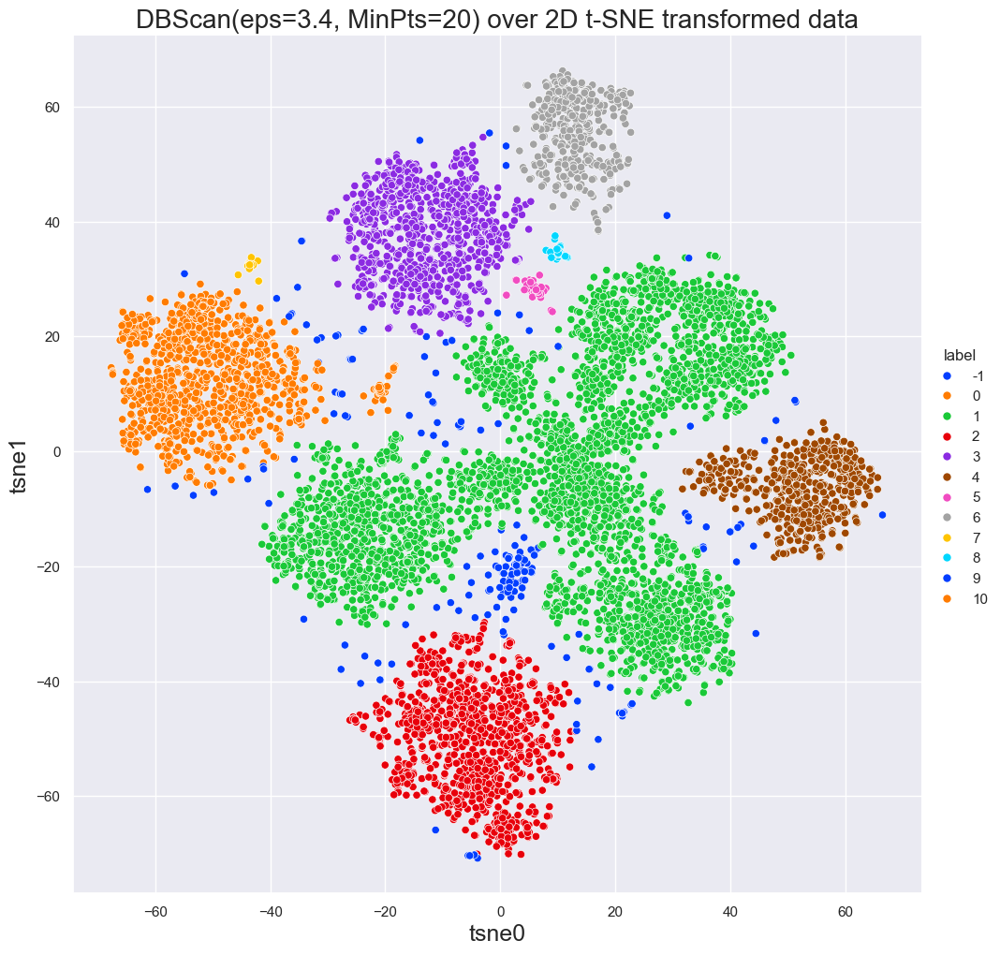

In [32]:
title = f'DBScan(eps={epsilon}, MinPts={min_samples}) over 2D t-SNE transformed data'
Plot2D_WithLabels (samples_TSNE_2D, labels_TSNE_2D, title, axes_TSNE_2D)

## Embeding BETO - MARIA

### Cargar Datos

In [33]:
embeddings_beto = np.load("EmoEvalEs-embeddings-BETO.npy")
embeddings_maria = np.load("EmoEvalEs-embeddings-MARIA.npy")

combined_embeddings = np.concatenate((embeddings_beto, embeddings_maria), axis=1)

samples = embeddings_beto



### Nearest Neighbor

C:\Users\diego\AppData\Local\Temp\ipykernel_22264\3894962603.py:49: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(fontsize=legend_size)


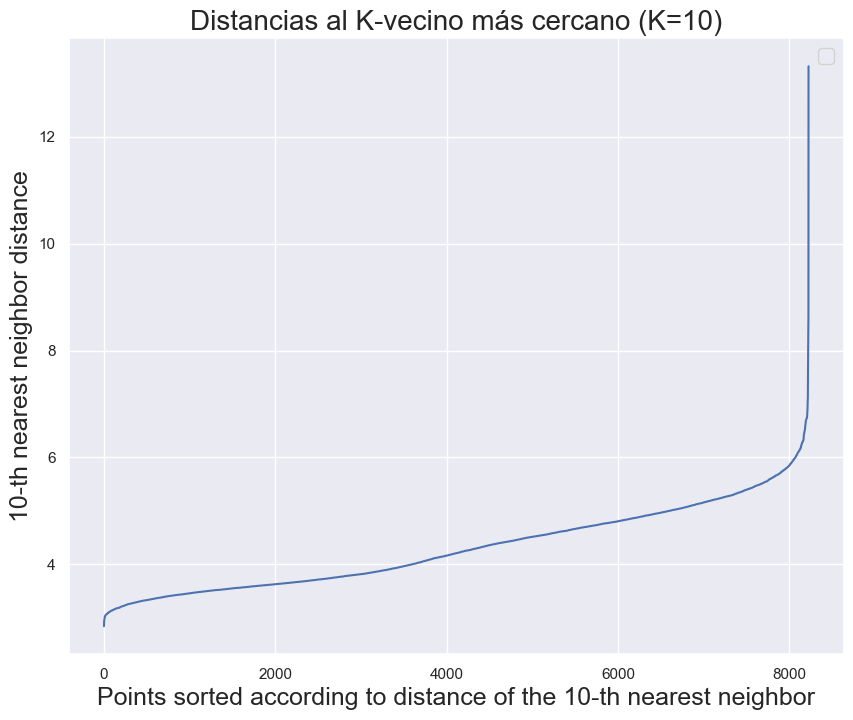

In [34]:
PlotDistancesToKnearestNeighbor(embeddings_beto, 10)
pca2D = PCA(2)
pca2D.fit(embeddings_beto)  # Utiliza los embeddings pre-generados
sample_PCA_2D = pca2D.transform(embeddings_beto)
km = KMeans(n_clusters=3, init='random', max_iter=200, random_state=0).fit(embeddings_beto)



### DBScan sin Reducción de Dimensionalidad

In [35]:
min_samples = 10
epsilon_values = [4,4.1,4.2,4.3,4.4,4.5,4.6,4.7,4.8,5,6]
aux_labels = {}
for epsilon in epsilon_values:
  aux_labels[epsilon] = ApplyDBScanToData(beto_embeddings, epsilon, min_samples=min_samples)


Test for epsilon = 4
Estimated number of clusters: 3
Estimated number of noise points: 4069
Silhouette Coefficient: 0.047

Test for epsilon = 4.1
Estimated number of clusters: 3
Estimated number of noise points: 3718
Silhouette Coefficient: 0.040

Test for epsilon = 4.2
Estimated number of clusters: 1
Estimated number of noise points: 3377
Silhouette Coefficient: 0.121

Test for epsilon = 4.3
Estimated number of clusters: 2
Estimated number of noise points: 2995
Silhouette Coefficient: 0.092

Test for epsilon = 4.4
Estimated number of clusters: 2
Estimated number of noise points: 2618
Silhouette Coefficient: 0.049

Test for epsilon = 4.5
Estimated number of clusters: 1
Estimated number of noise points: 2234
Silhouette Coefficient: 0.119

Test for epsilon = 4.6
Estimated number of clusters: 1
Estimated number of noise points: 1881
Silhouette Coefficient: 0.122

Test for epsilon = 4.7
Estimated number of clusters: 1
Estimated number of noise points: 1584
Silhouette Coefficient: 0.127

T

In [36]:
epsilon = 6
labels = aux_labels[epsilon]

### K-Means sin PCA

In [37]:
for i in range(2,20):
    km = KMeans(n_clusters=i, init='random', max_iter=200, random_state=0).fit(beto_embeddings)
    sample_km = km.labels_
    score = metrics.silhouette_score(beto_embeddings, sample_km)
    print("cantidad de cluster:", i)
    print("Silhouette Coefficient: %0.3f" % score)

cantidad de cluster: 2
Silhouette Coefficient: 0.148
cantidad de cluster: 3
Silhouette Coefficient: 0.152
cantidad de cluster: 4
Silhouette Coefficient: 0.141
cantidad de cluster: 5
Silhouette Coefficient: 0.050
cantidad de cluster: 6
Silhouette Coefficient: 0.055
cantidad de cluster: 7
Silhouette Coefficient: 0.054
cantidad de cluster: 8
Silhouette Coefficient: 0.057
cantidad de cluster: 9
Silhouette Coefficient: 0.059
cantidad de cluster: 10
Silhouette Coefficient: 0.041
cantidad de cluster: 11
Silhouette Coefficient: 0.053
cantidad de cluster: 12
Silhouette Coefficient: 0.046
cantidad de cluster: 13
Silhouette Coefficient: 0.046
cantidad de cluster: 14
Silhouette Coefficient: 0.046
cantidad de cluster: 15
Silhouette Coefficient: 0.048
cantidad de cluster: 16
Silhouette Coefficient: 0.038
cantidad de cluster: 17
Silhouette Coefficient: 0.038
cantidad de cluster: 18
Silhouette Coefficient: 0.040
cantidad de cluster: 19
Silhouette Coefficient: 0.041


### PCA 2D

#### Búsqueda N° óptimo CLusters

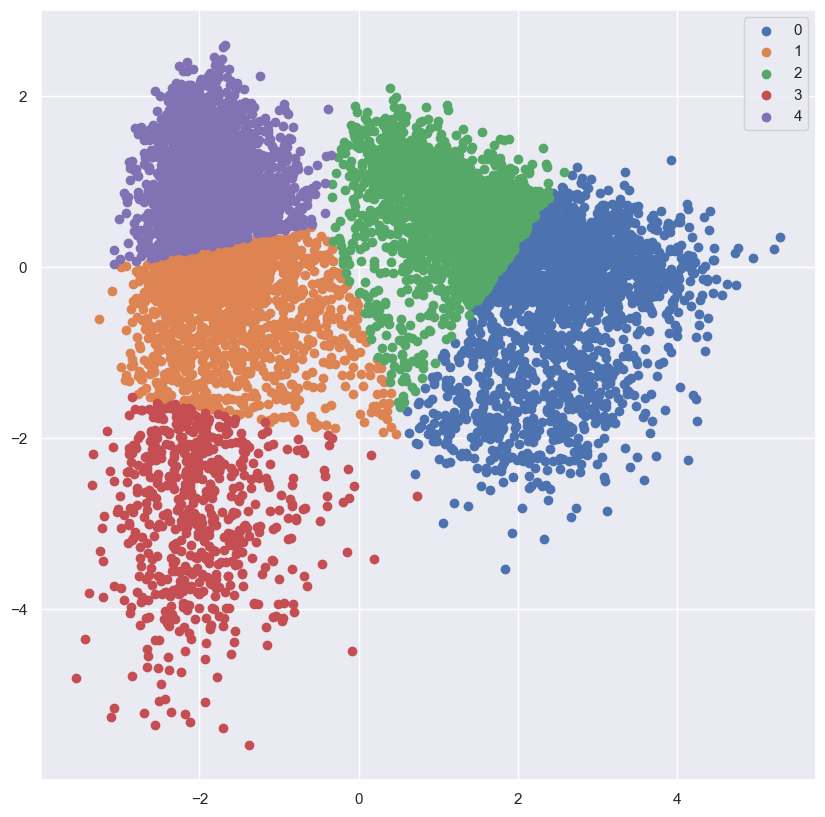

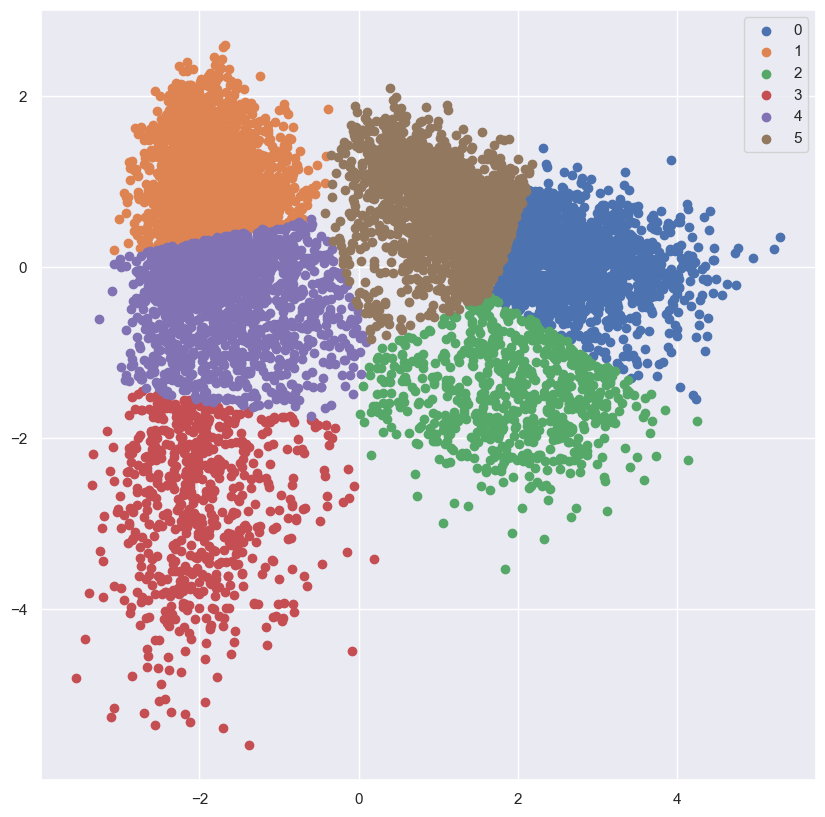

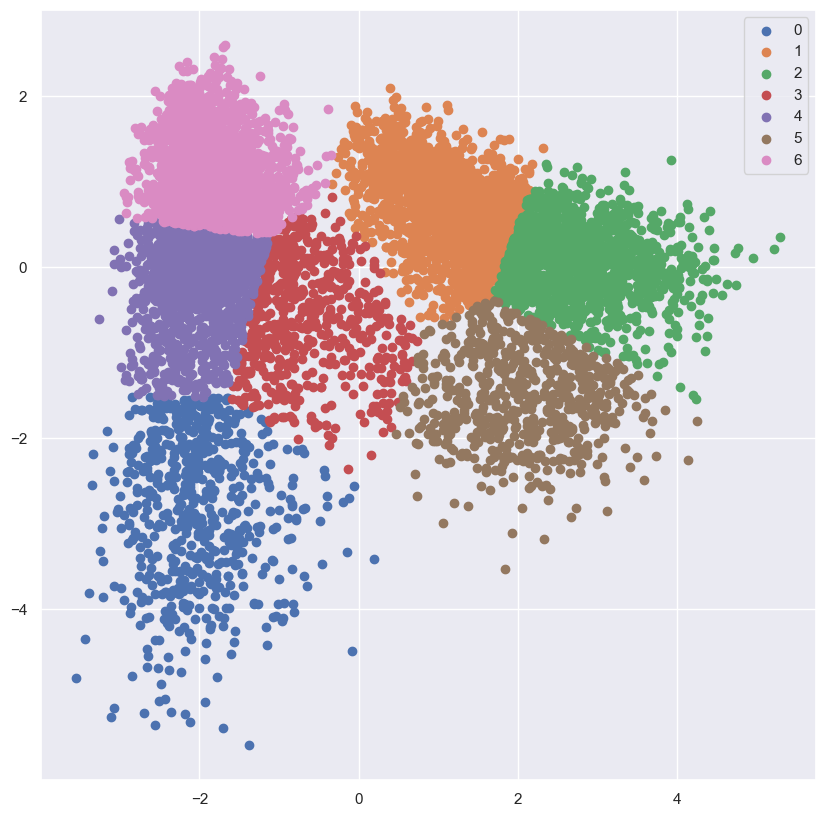

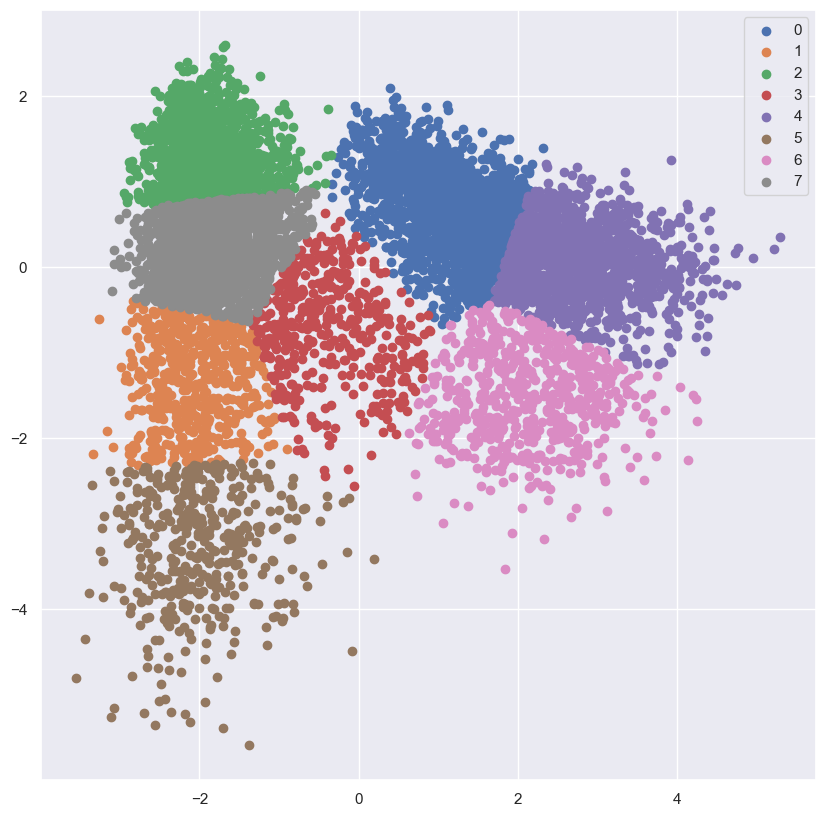

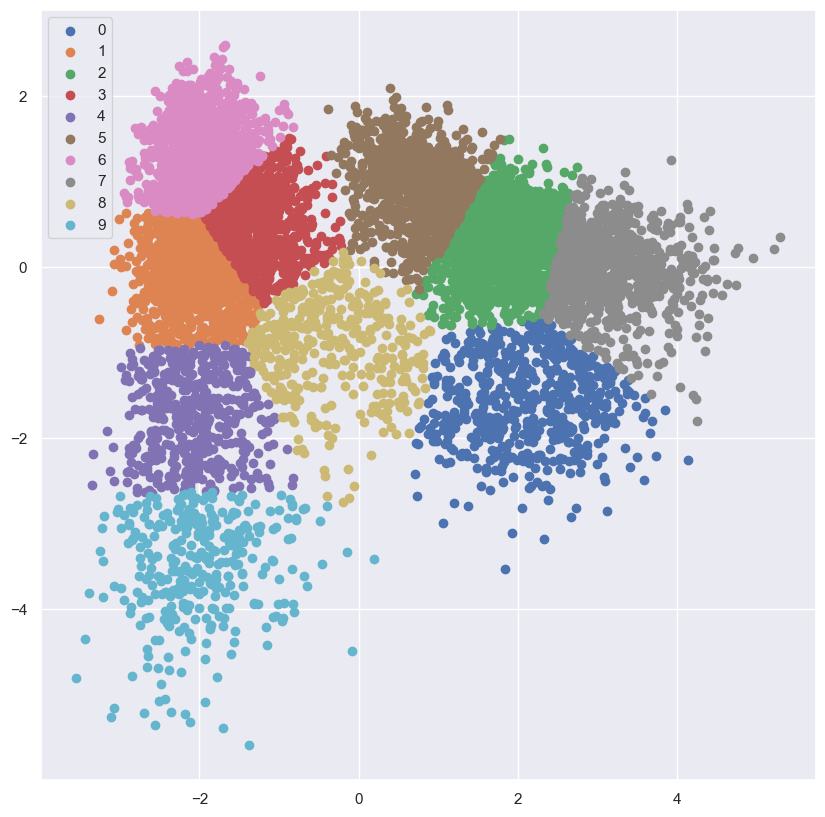

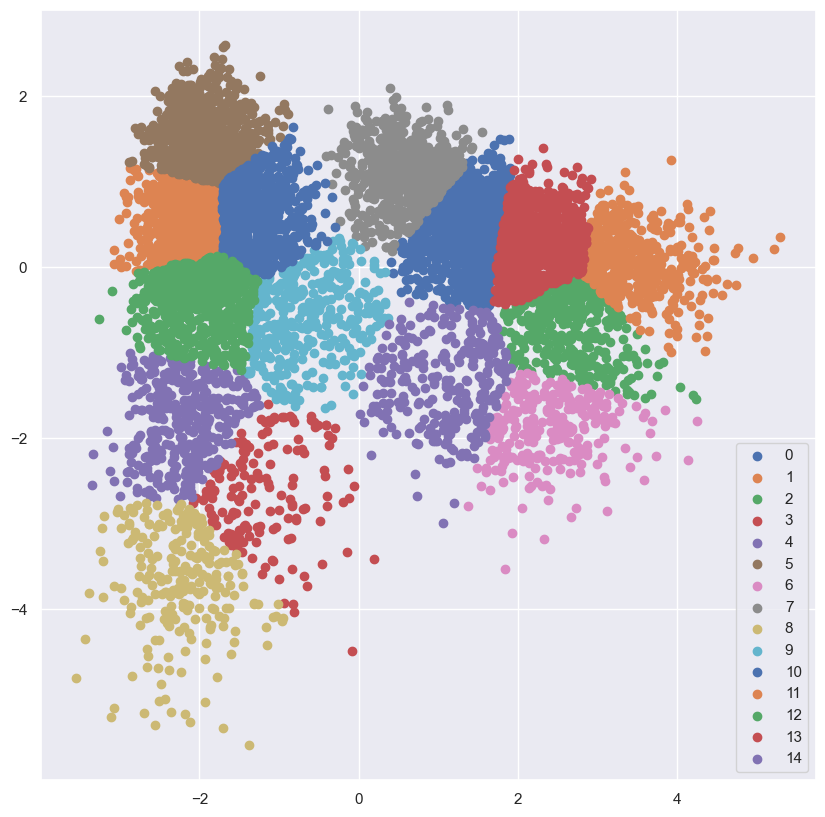

In [38]:
# Raw Data
pca2D = PCA(2)
 
#Transform the data
df_2D = pca2D.fit_transform(beto_embeddings)

df_samples_PCA_2D = pd.DataFrame(data=df_2D, columns=["pca0", "pca1"])

clusters = [5,6,7,8,10,15]
silhouette_avg = []

for i in clusters:
    #Initialize the class object
    kmeans = KMeans(n_clusters=i)
     
    #predict the labels of clusters.
    label = kmeans.fit_predict(df_samples_PCA_2D)
     
    #Getting unique labels
    u_labels = np.unique(label)
     
    #plotting the results:
    for i in u_labels:
        plt.scatter(df_2D[label == i , 0] , df_2D[label == i , 1] , label = i)
    plt.legend()
    plt.show()
    
    score = silhouette_score(df_samples_PCA_2D, kmeans.labels_)
    silhouette_avg.append(score)

#### Modelacion N° clusters - Score Silhouette

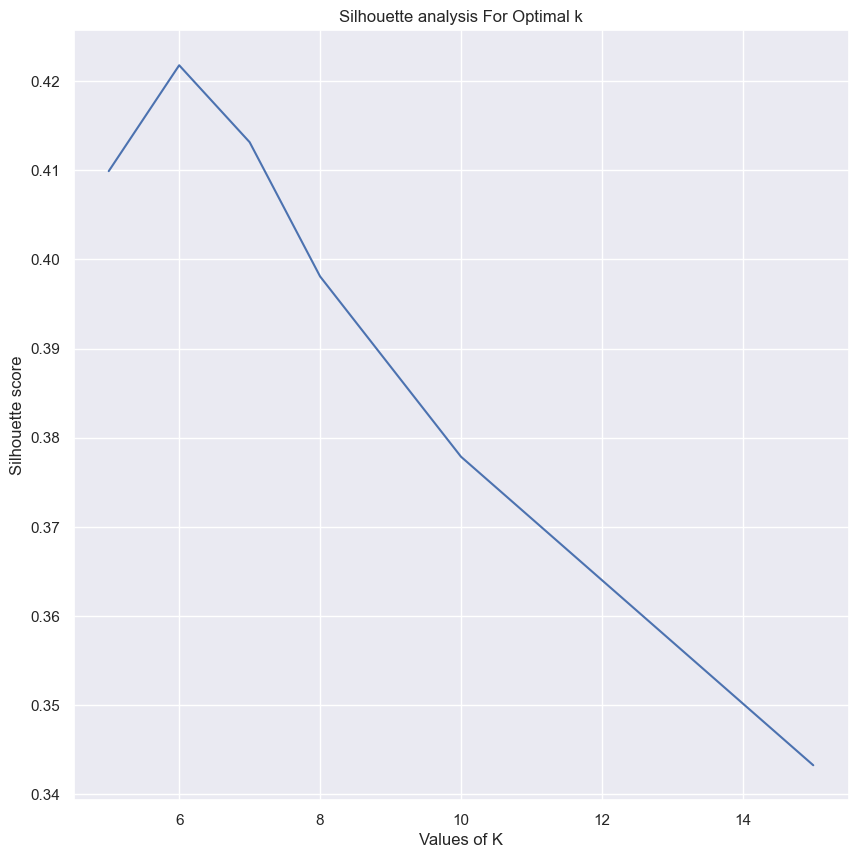

N° Clusters con mejor Score:  6 
Score:  0.42178029977216097


In [39]:
plt.plot(clusters,silhouette_avg)
plt.xlabel("Values of K") 
plt.ylabel("Silhouette score") 
plt.title("Silhouette analysis For Optimal k")
plt.show()
print("N° Clusters con mejor Score: ",clusters[pd.Series(silhouette_avg).idxmax()],"\nScore: ",max(silhouette_avg))

#### Modelado K-Means con N° Óptimo Clusters 2D

C:\Users\diego\AppData\Local\Temp\ipykernel_22264\1793276746.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.text(row[0]+.5, row[1], 'C'+str(row[2].astype(int)), fontsize = 20, color='black', weight='semibold')


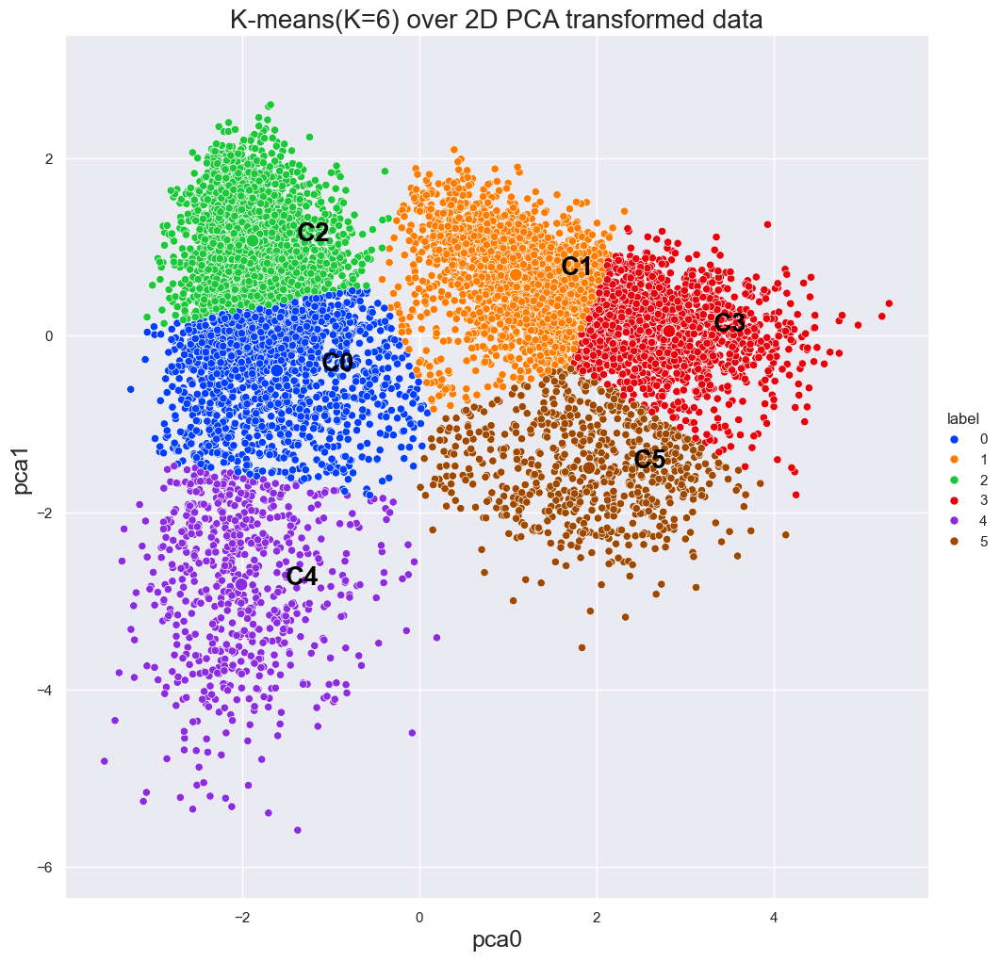

In [40]:
n_clusters = clusters[pd.Series(silhouette_avg).idxmax()]
kmeans = KMeans(n_clusters=n_clusters)
label = kmeans.fit_predict(df_samples_PCA_2D)

axes_PCA = {'x': 'pca0', 'y': 'pca1'}
title = f'K-means(K={n_clusters}) over 2D PCA transformed data'
plot = Plot2D_WithLabels(df_samples_PCA_2D, kmeans.labels_, title, axes_PCA, centroids_2D=kmeans.cluster_centers_)

### PCA 3D

#### Búsqueda N° óptimo Clusters

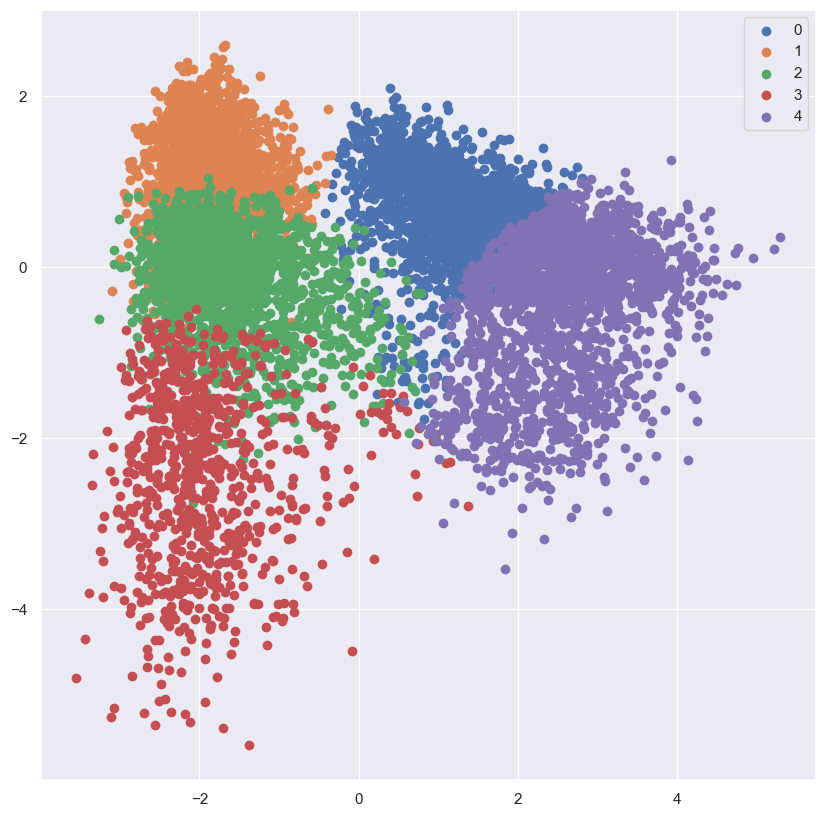

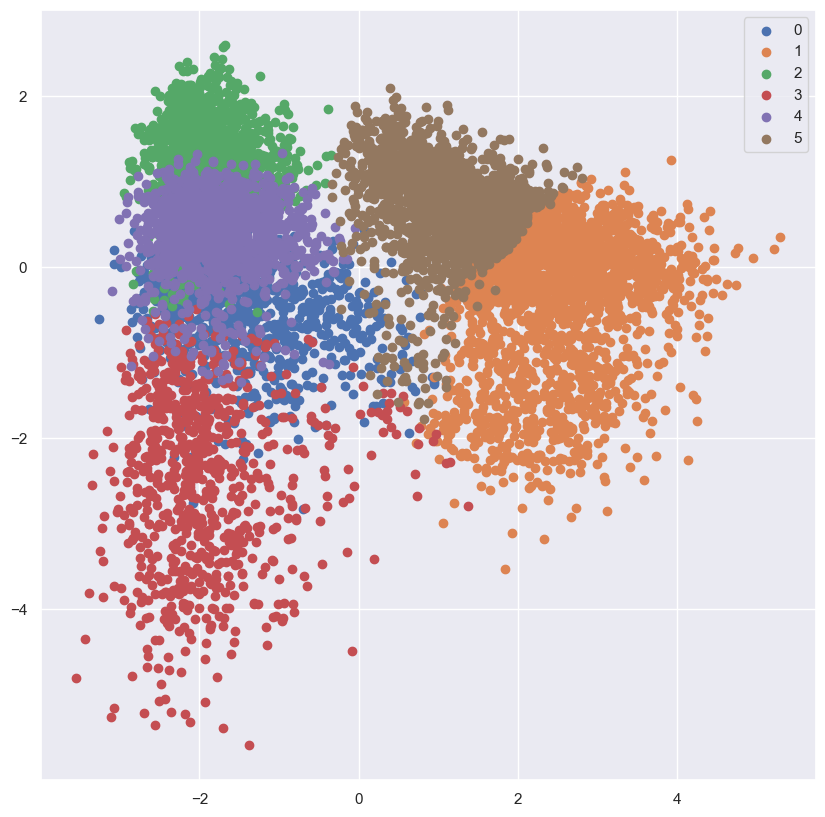

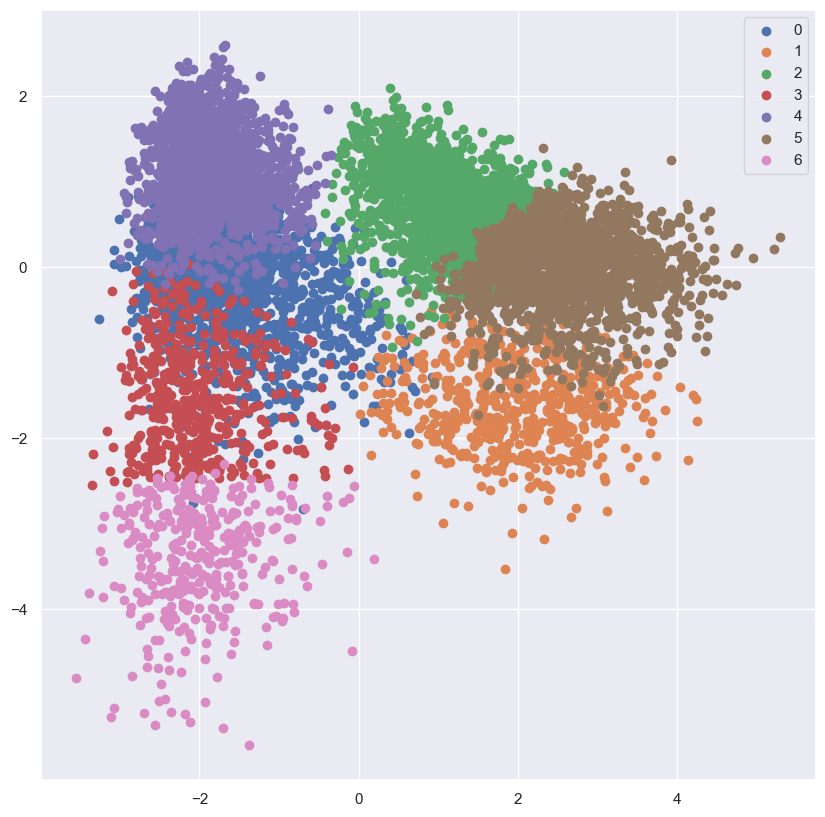

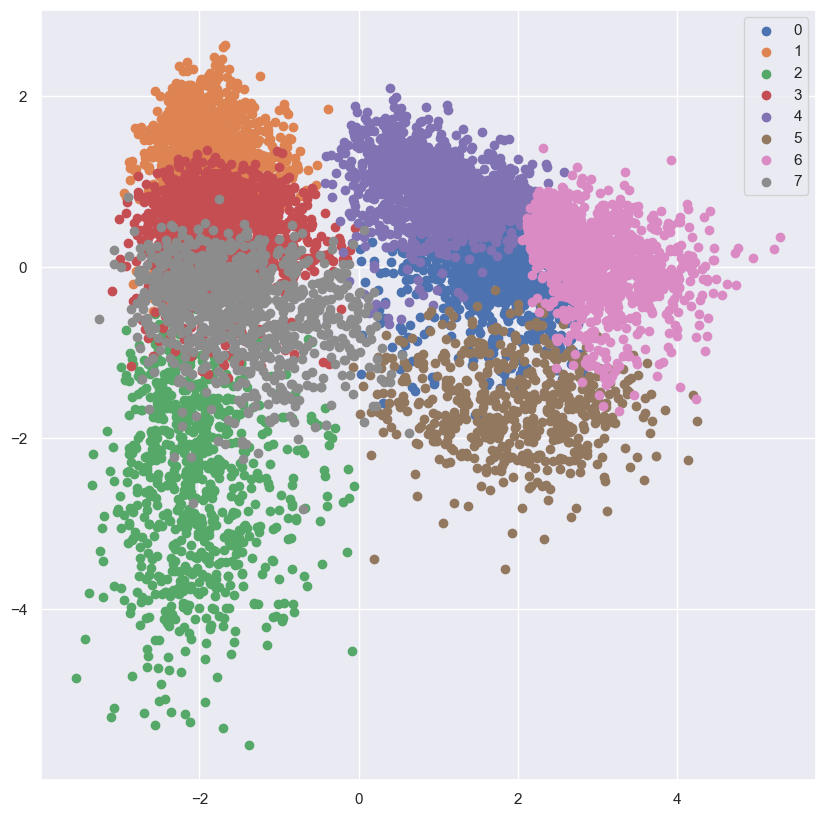

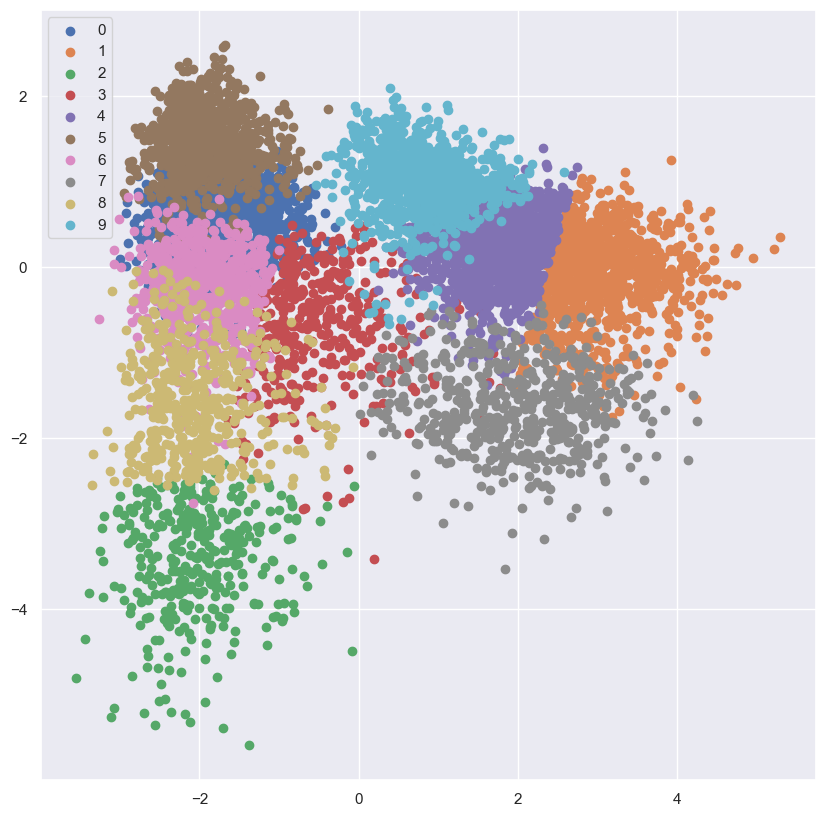

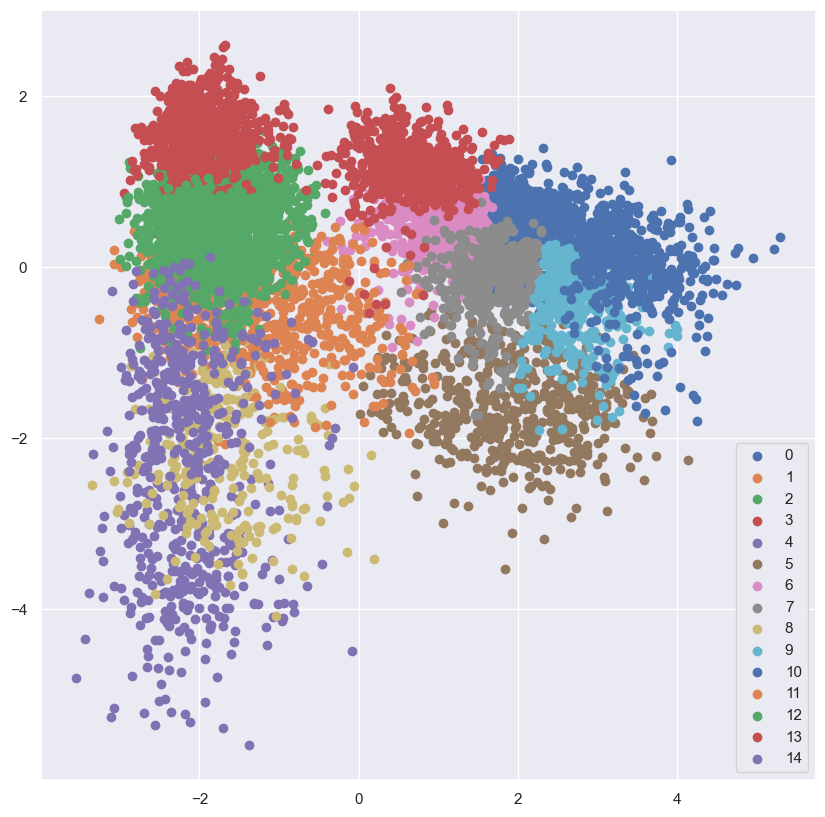

In [41]:
pca3D = PCA(n_components=3)
df_3D = pca3D.fit_transform(beto_embeddings)
df_samples_PCA_3D = pd.DataFrame(data=df_3D, columns=["pca0", "pca1", "pca2"])

clusters = [5,6,7,8,10,15]
silhouette_avg = []

for i in clusters:
    #Initialize the class object
    kmeans = KMeans(n_clusters=i)
     
    #predict the labels of clusters.
    label = kmeans.fit_predict(df_samples_PCA_3D)
     
    #Getting unique labels
    u_labels = np.unique(label)
     
    #plotting the results:
    for i in u_labels:
        plt.scatter(df_3D[label == i , 0] , df_3D[label == i , 1] , label = i)
    plt.legend()
    plt.show()
    
    score = silhouette_score(df_samples_PCA_3D, kmeans.labels_)
    silhouette_avg.append(score)

#### Modelacion N° clusters - Score Silhouette

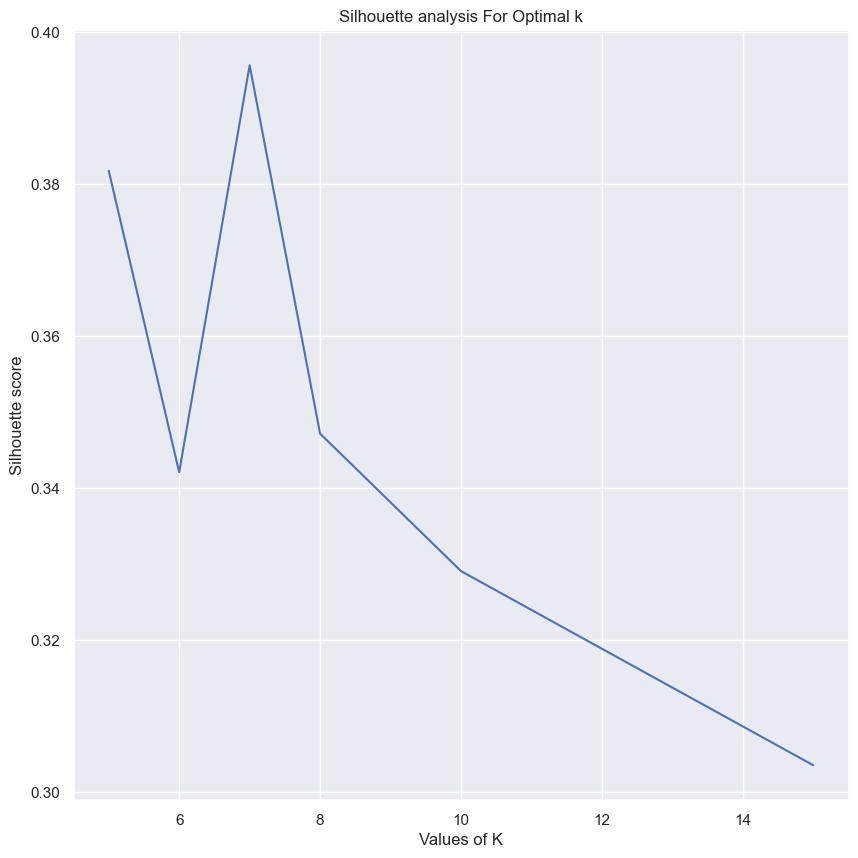

N° Clusters con mejor Score:  7 
Score:  0.3956513855387336


In [42]:
plt.plot(clusters,silhouette_avg)
plt.xlabel("Values of K") 
plt.ylabel("Silhouette score") 
plt.title("Silhouette analysis For Optimal k")
plt.show()
print("N° Clusters con mejor Score: ",clusters[pd.Series(silhouette_avg).idxmax()],"\nScore: ",max(silhouette_avg))

#### Modelado K-Means con N° Óptimo Clusters 3D

In [43]:

def Plot3D_WithLabels (samples_3D, labels, title, axes = {'x': 'x', 'y': 'y', 'z': 'z'}, centroids_3D=None):

  """
  samples_3D (numpy.ndarray): array tipo embedding cuyo
        shape es (num_muestras, 3) ; 3 por las tres coordenadas

  labels (array): etiqueta perteneciente a cada muestra.

  title(string): titulo de la figura que se utiliza para el plot
  """

  # First we create the dataframe
  df_samples_3D_labeled = pd.DataFrame(data=samples_3D, columns=[axes['x'], axes['y'], axes['z']])

  # Then we add the labels column
  df_samples_3D_labeled['label'] = labels.tolist()
  df_samples_3D_labeled['label'] = df_samples_3D_labeled["label"].astype(str)

  if centroids_3D is not None:
    # Same applies for centroids when these are provided as an argument
    labels_centroid_aux = np.arange(len(centroids_3D), dtype=int)
    df_centroids_3D_labeled = pd.DataFrame(data=centroids_3D, columns=[axes['x'], axes['y'], axes['z']])
    df_centroids_3D_labeled['label'] = labels_centroid_aux.tolist()

    # We create an additional column with the dot size used for each type of sample
    size_no_centroid = np.ones(len(samples_3D)) * 10 # for regular samples
    size_centroid = np.ones(len(centroids_3D)) * 50 # for centroids
    size_col = np.append(size_no_centroid, size_centroid) # new col to be added to the dataframe

    # We also create another additional column with the labels for each type of sample
    no_es_centroide_aux = [' '] * len(samples_3D) # empty label for regular samples
    es_centroide_aux = []
    for i in range(len(centroids_3D)):
      es_centroide_aux.append('C%d' % i) # Ci label for centroid i
    centroid_col = no_es_centroide_aux + es_centroide_aux # new col to be added to the dataframe

    # Next we concatenate both dataframes: first, regular samples, then, centroids
    df_samples_and_centroids = pd.concat([df_samples_3D_labeled, df_centroids_3D_labeled], ignore_index=True)
      

    # We add the new column with the labels distinguishing regular samples from centroids
    df_samples_and_centroids['centroid'] = centroid_col

    # New column is re-casted as a string column
    df_samples_and_centroids['centroid'] = df_samples_and_centroids['centroid'].astype(str)

    # We add the new column with the corresponding size for both regular samples and centroids
    df_samples_and_centroids['size'] = size_col

    # We ensure that the 'label' column is numeric since we will sort the dataframe upon this one
    df_samples_and_centroids['label'] = pd.to_numeric(df_samples_and_centroids['label'])

    # We finally sort the dataframe by the 'label' column in ascending order
    df_samples_and_centroids_sorted = df_samples_and_centroids.sort_values(by=['label'], ascending=True)

    # And plot both the samples and their corresponding centroids
    fig = px.scatter_3d(df_samples_and_centroids_sorted, x=axes['x'], y=axes['y'], z=axes['z'], text='centroid', size='size', color='label')
  else:
    # We ensure that the 'label' column is numeric since we will sort the dataframe upon this one
    df_samples_3D_labeled['label'] = pd.to_numeric(df_samples_3D_labeled['label'])

    # We finally sort the dataframe by the 'label' column in ascending order
    df_samples_and_centroids_sorted = df_samples_3D_labeled.sort_values(by=['label'], ascending=True)

    fig = px.scatter_3d(df_samples_and_centroids_sorted, x=axes['x'], y=axes['y'], z=axes['z'], color='label', size=np.ones(len(samples_3D))) #, color_continuous_scale='delta')

  fig.update_traces(textposition='top center')
  fig.update_layout(scene_aspectmode='data')
  fig.update_layout(uniformtext_minsize=60)

  fig.update_layout(title_font_size=20,
                    title={
                    'text': title,
                    'y': 0.9,
                    'x': 0.05,
                    'xanchor': 'left',
                    'yanchor': 'top'})
  # tight layout
  fig.update_layout(autosize = True, margin = dict(l=50, r=0, b=10, t=30))
  fig.show()

In [44]:
n_clusters = clusters[pd.Series(silhouette_avg).idxmax()]
kmeans = KMeans(n_clusters=n_clusters)
label = kmeans.fit_predict(df_samples_PCA_3D)
axes_PCA_3D = {'x': 'pca0', 'y': 'pca1', 'z': 'pca2'}

title = f'K-means(K={n_clusters}) over 3D PCA transformed data'
plot = Plot3D_WithLabels (df_samples_PCA_3D, kmeans.labels_, title, axes_PCA_3D, centroids_3D=kmeans.cluster_centers_)

### t-SNE 2D

#### Reducción de Dimensión

In [46]:
tsne2D = TSNE(n_components=2)
samples_TSNE_2D = tsne2D.fit_transform(beto_embeddings)
df_samples_TSNE_2D = pd.DataFrame(data=samples_TSNE_2D, columns=["tsne0", "tsne1"])

#### Visualización t-SNE 2D

C:\Users\diego\AppData\Local\Temp\ipykernel_22264\3894962603.py:18: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.



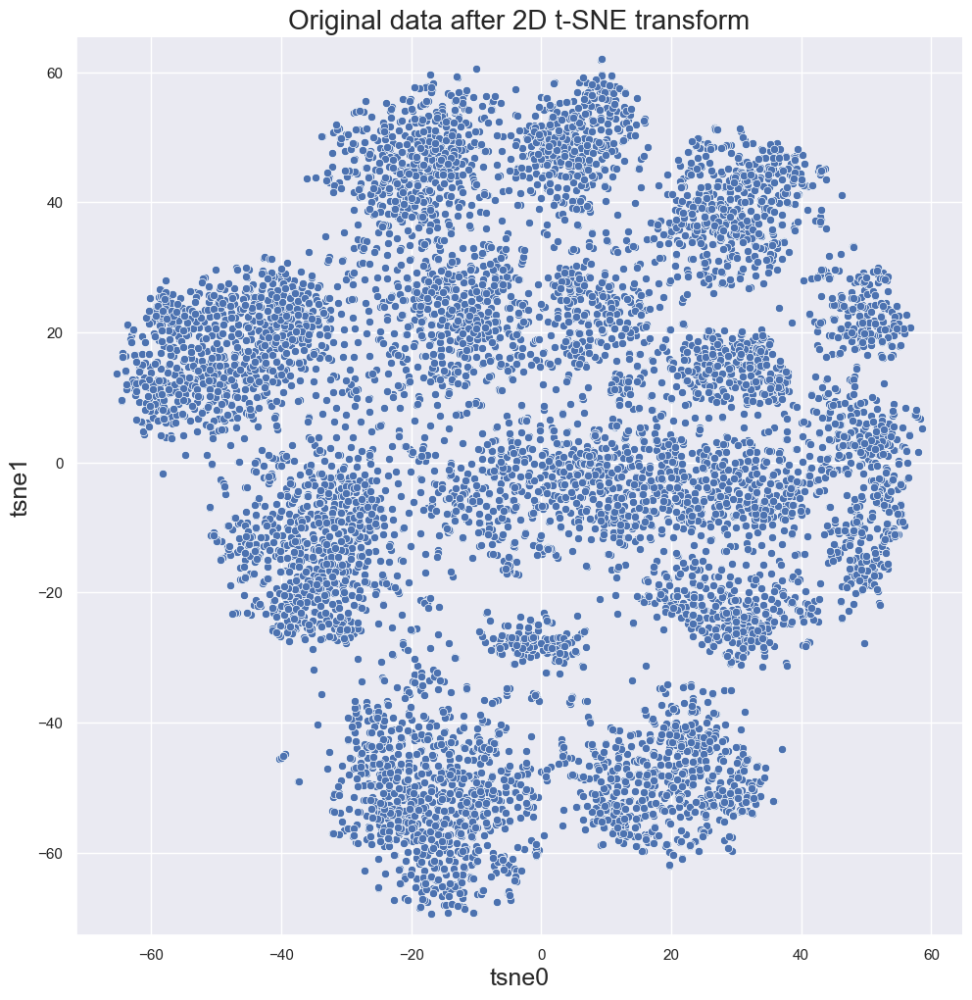

In [47]:
title = 'Original data after 2D t-SNE transform'
axes_TSNE_2D = {'x': 'tsne0', 'y': 'tsne1'}
Plot2D (samples_TSNE_2D, title, axes_TSNE_2D)

#### DBScan t-SNE 2D

##### Modelación Nearest Neighbor

C:\Users\diego\AppData\Local\Temp\ipykernel_22264\3894962603.py:49: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



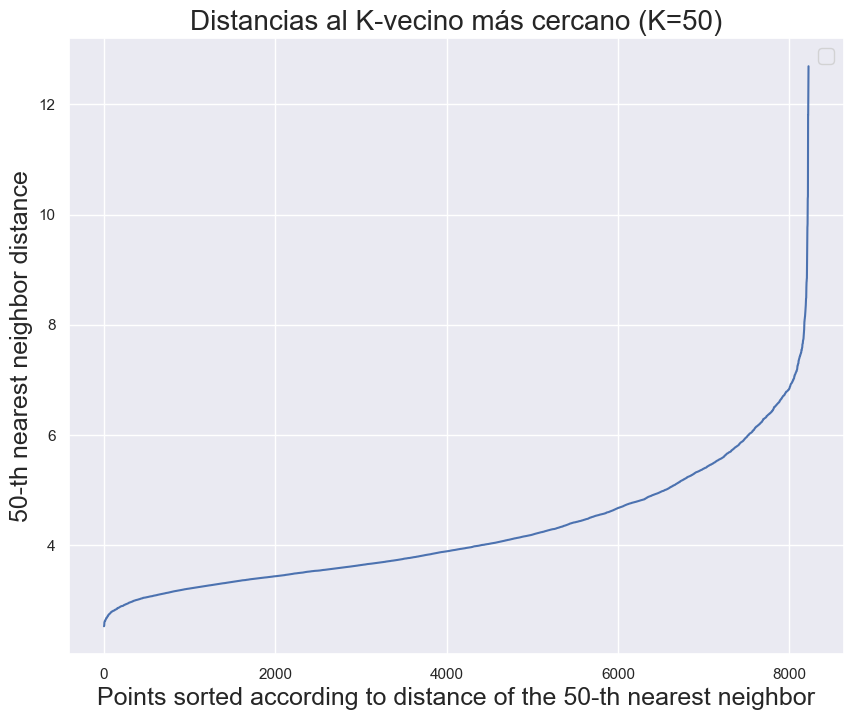

In [48]:
PlotDistancesToKnearestNeighbor(samples_TSNE_2D, 50) # notese que el parametro de entrada NO es samples

##### Epsilons Score Silhouette 

In [49]:
min_samples = 50
epsilon_values = [3.9, 4, 4.05, 4.055,4.1, 4.3, 4.5, 4.7, 4.9, 5, 5.2, 5.4, 5.6, 5.8]
aux_labels = {}
for epsilon in epsilon_values:
  aux_labels[epsilon] = ApplyDBScanToData (samples_TSNE_2D, epsilon, min_samples=min_samples)

epsilon = 4.05
labels_TSNE_2D = aux_labels[epsilon]


Test for epsilon = 3.9
Estimated number of clusters: 16
Estimated number of noise points: 1424
Silhouette Coefficient: 0.277

Test for epsilon = 4
Estimated number of clusters: 15
Estimated number of noise points: 1212
Silhouette Coefficient: 0.318

Test for epsilon = 4.05
Estimated number of clusters: 14
Estimated number of noise points: 1083
Silhouette Coefficient: 0.278

Test for epsilon = 4.055
Estimated number of clusters: 14
Estimated number of noise points: 1076
Silhouette Coefficient: 0.278

Test for epsilon = 4.1
Estimated number of clusters: 14
Estimated number of noise points: 1005
Silhouette Coefficient: 0.286

Test for epsilon = 4.3
Estimated number of clusters: 14
Estimated number of noise points: 758
Silhouette Coefficient: 0.306

Test for epsilon = 4.5
Estimated number of clusters: 15
Estimated number of noise points: 476
Silhouette Coefficient: 0.301

Test for epsilon = 4.7
Estimated number of clusters: 11
Estimated number of noise points: 326
Silhouette Coefficient: 

##### Visualización DBScan

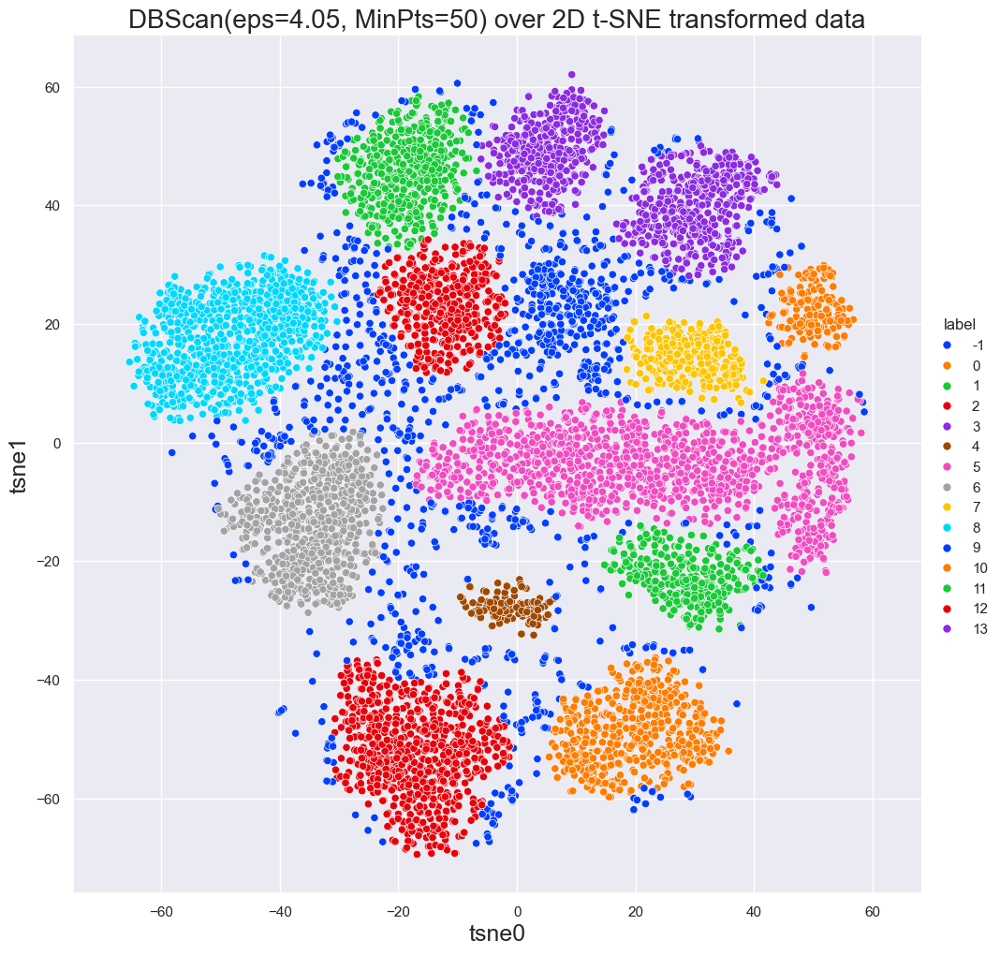

In [50]:
title = f'DBScan(eps={epsilon}, MinPts={min_samples}) over 2D t-SNE transformed data'
Plot2D_WithLabels (samples_TSNE_2D, labels_TSNE_2D, title, axes_TSNE_2D)

### t-SNE 3D

#### Reducción de Dimensión

In [52]:
tsne3D = TSNE(n_components=3)
samples_TSNE_3D = tsne2D.fit_transform(beto_embeddings)
df_samples_TSNE_3D = pd.DataFrame(data=samples_TSNE_3D, columns=["tsne0", "tsne1"])

#### Modelación Nearest Neighbor

C:\Users\diego\AppData\Local\Temp\ipykernel_22264\3894962603.py:49: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



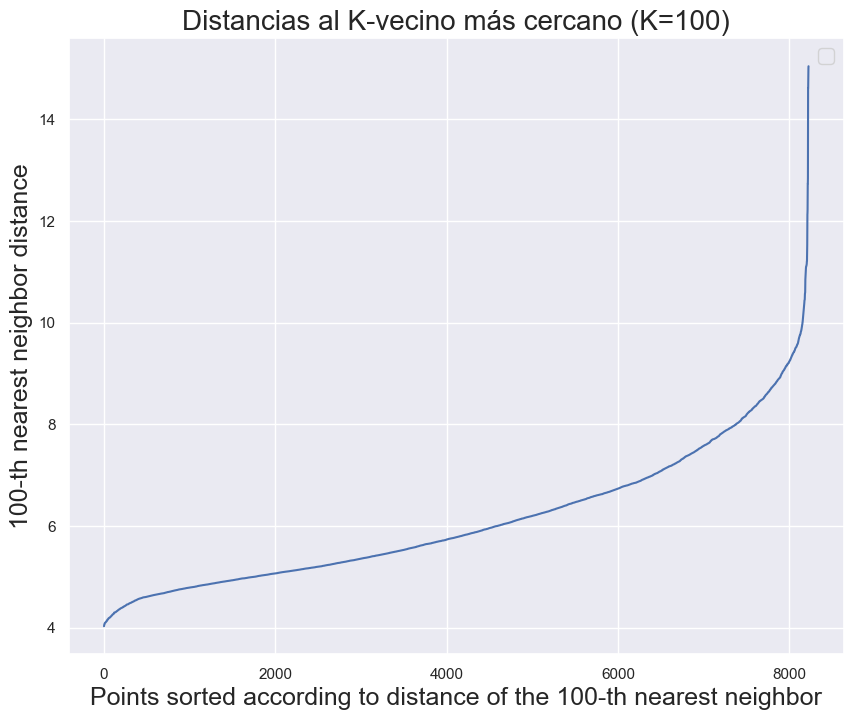

In [53]:
PlotDistancesToKnearestNeighbor(samples_TSNE_3D, 100)

### DBScan t-SNE 3D

#### Epsilons Score Silhouette

In [54]:
min_samples = 100
epsilon_values = [4.5, 5, 5.5, 5.7, 5.9, 5.95, 6, 6.1, 6.2, 6.3, 6.5, 6.6,6.7, 6.9, 7, 7.5]
aux_labels = {}
for epsilon in epsilon_values:
  aux_labels[epsilon] = ApplyDBScanToData (samples_TSNE_3D, epsilon, min_samples=min_samples)

epsilon = 6
labels_TSNE_3D = aux_labels[epsilon]


Test for epsilon = 4.5
Estimated number of clusters: 11
Estimated number of noise points: 6229
Silhouette Coefficient: -0.349

Test for epsilon = 5
Estimated number of clusters: 16
Estimated number of noise points: 2599
Silhouette Coefficient: 0.185

Test for epsilon = 5.5
Estimated number of clusters: 15
Estimated number of noise points: 1132
Silhouette Coefficient: 0.341

Test for epsilon = 5.7
Estimated number of clusters: 15
Estimated number of noise points: 815
Silhouette Coefficient: 0.363

Test for epsilon = 5.9
Estimated number of clusters: 15
Estimated number of noise points: 576
Silhouette Coefficient: 0.380

Test for epsilon = 5.95
Estimated number of clusters: 15
Estimated number of noise points: 516
Silhouette Coefficient: 0.383

Test for epsilon = 6
Estimated number of clusters: 13
Estimated number of noise points: 466
Silhouette Coefficient: 0.310

Test for epsilon = 6.1
Estimated number of clusters: 13
Estimated number of noise points: 406
Silhouette Coefficient: 0.313

#### Visualización t-SNE 3D

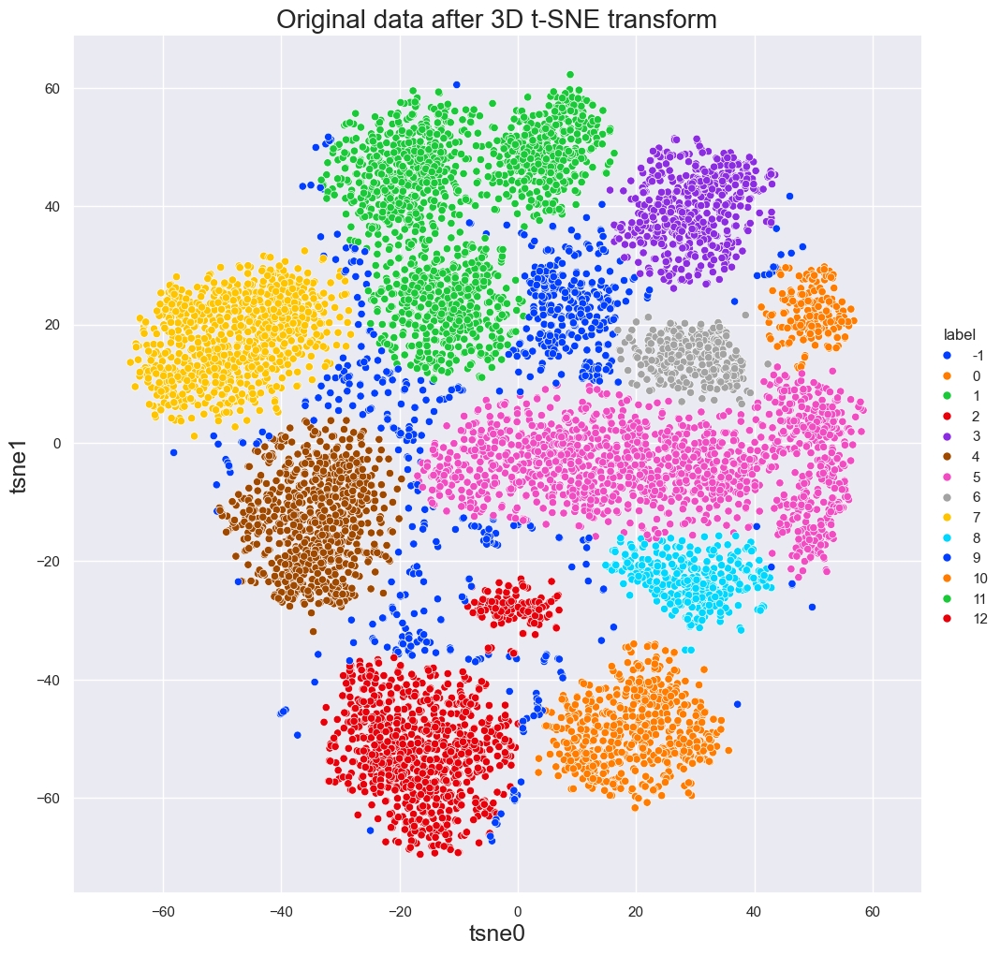

In [55]:
title = f'DBScan(eps={epsilon}, MinPts={min_samples}) over 2D t-SNE transformed data'
title = 'Original data after 3D t-SNE transform'
axes_TSNE_3D = {'x': 'tsne0', 'y': 'tsne1'}
Plot2D_WithLabels (samples_TSNE_3D, labels_TSNE_3D, title, axes_TSNE_3D)

### DBScan


#### DBScan - PCA 2D

C:\Users\diego\AppData\Local\Temp\ipykernel_22264\3894962603.py:49: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



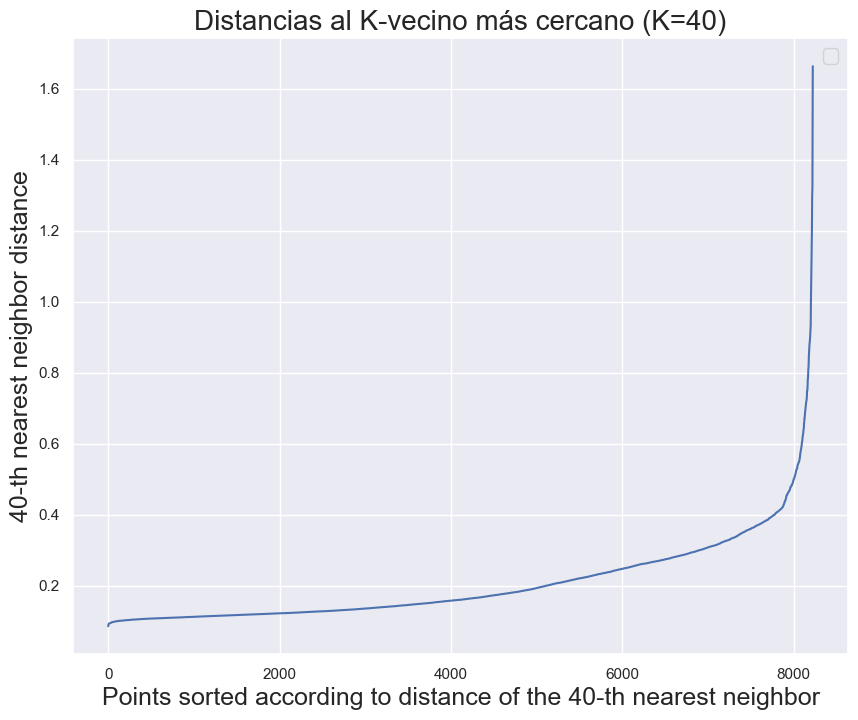

In [56]:
n_samples = 40
PlotDistancesToKnearestNeighbor(df_samples_PCA_2D, n_samples)


Test for epsilon = 0.2
Estimated number of clusters: 2
Estimated number of noise points: 4501
Silhouette Coefficient: 0.117

Test for epsilon = 0.28
Estimated number of clusters: 2
Estimated number of noise points: 2461
Silhouette Coefficient: 0.394

Test for epsilon = 0.29
Estimated number of clusters: 2
Estimated number of noise points: 2344
Silhouette Coefficient: 0.408

Test for epsilon = 0.3
Estimated number of clusters: 2
Estimated number of noise points: 2226
Silhouette Coefficient: 0.421

Test for epsilon = 0.31
Estimated number of clusters: 2
Estimated number of noise points: 2118
Silhouette Coefficient: 0.433

Test for epsilon = 0.32
Estimated number of clusters: 2
Estimated number of noise points: 2010
Silhouette Coefficient: 0.444

Test for epsilon = 0.33
Estimated number of clusters: 2
Estimated number of noise points: 1909
Silhouette Coefficient: 0.455

Test for epsilon = 0.34
Estimated number of clusters: 2
Estimated number of noise points: 1831
Silhouette Coefficient: 

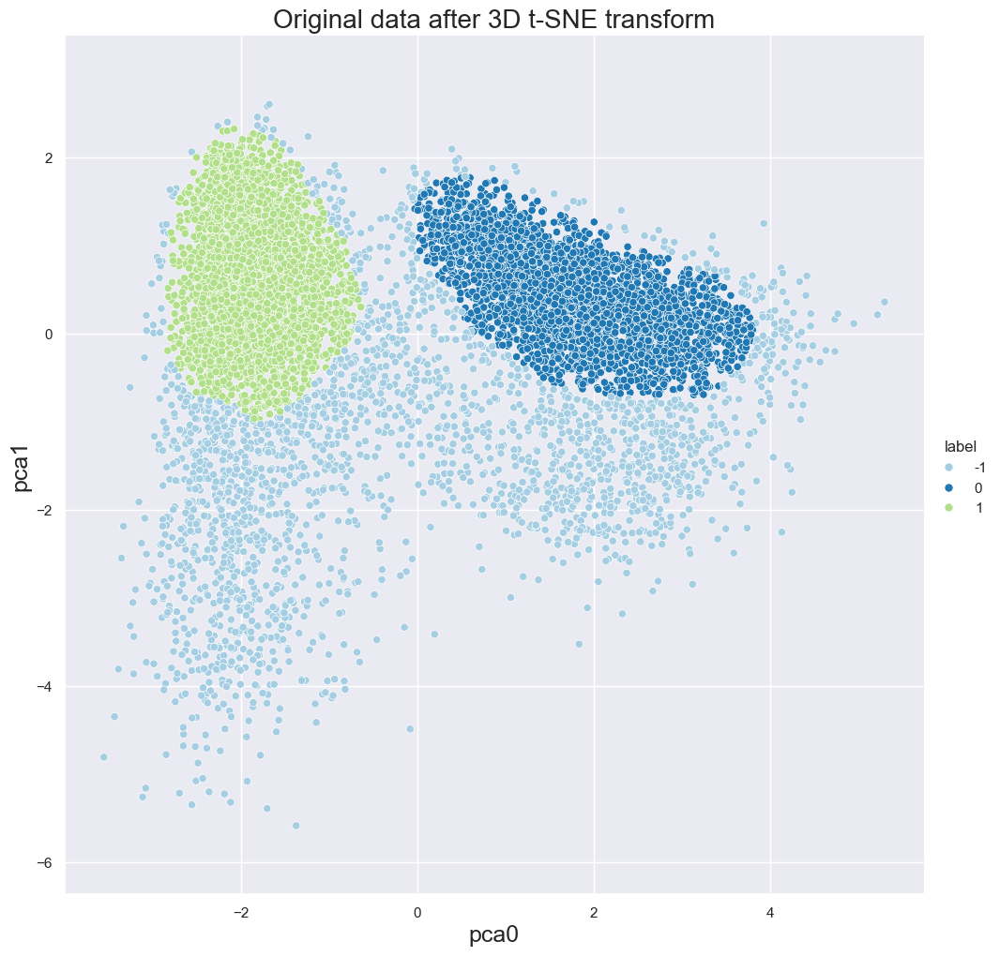

In [57]:
epsis = [0.2,0.28,0.29,0.3,0.31,0.32,0.33,0.34,0.35,0.37,0.39,0.4]
aux_labels = {}
for epsilon in epsis:
  aux_labels[epsilon] = ApplyDBScanToData (df_samples_PCA_2D, epsilon, min_samples=min_samples)

epsilon = 0.29
labels_PCA_2D = aux_labels[epsilon]
Plot2D_WithLabels (df_samples_PCA_2D, labels_PCA_2D, title, axes_PCA_2D, palette="Paired")

#### DBScan - PCA 3D

C:\Users\diego\AppData\Local\Temp\ipykernel_22264\3894962603.py:49: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



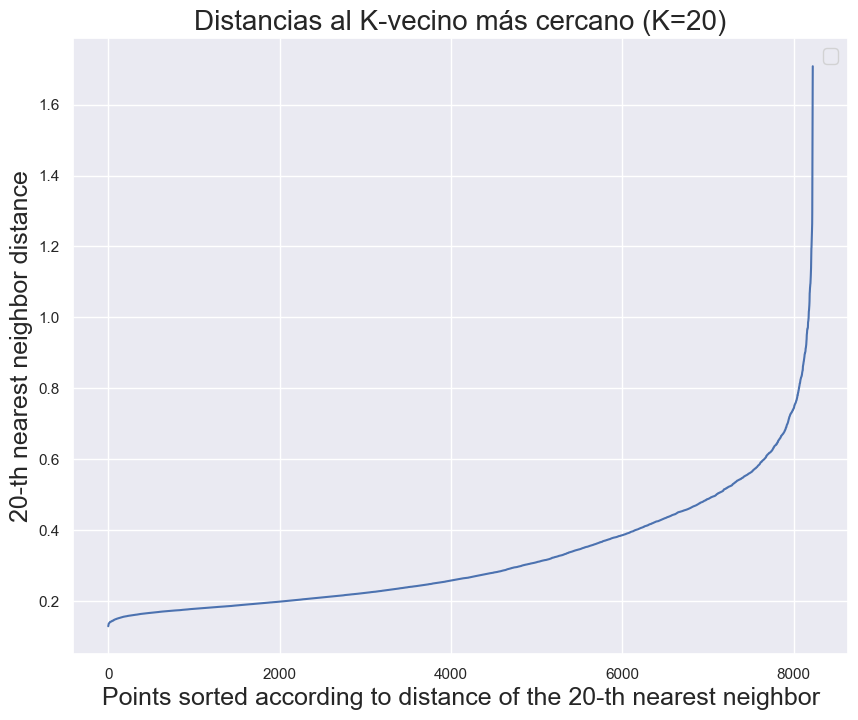

In [58]:
n_samples = 20
PlotDistancesToKnearestNeighbor(df_samples_PCA_3D, n_samples)


Test for epsilon = 0.2
Estimated number of clusters: 5
Estimated number of noise points: 4608
Silhouette Coefficient: -0.238

Test for epsilon = 0.28
Estimated number of clusters: 3
Estimated number of noise points: 2627
Silhouette Coefficient: 0.220

Test for epsilon = 0.29
Estimated number of clusters: 3
Estimated number of noise points: 2487
Silhouette Coefficient: 0.232

Test for epsilon = 0.3
Estimated number of clusters: 5
Estimated number of noise points: 2326
Silhouette Coefficient: 0.096

Test for epsilon = 0.31
Estimated number of clusters: 5
Estimated number of noise points: 2225
Silhouette Coefficient: 0.106

Test for epsilon = 0.32
Estimated number of clusters: 5
Estimated number of noise points: 2113
Silhouette Coefficient: 0.140

Test for epsilon = 0.33
Estimated number of clusters: 8
Estimated number of noise points: 1958
Silhouette Coefficient: 0.021

Test for epsilon = 0.34
Estimated number of clusters: 7
Estimated number of noise points: 1831
Silhouette Coefficient:

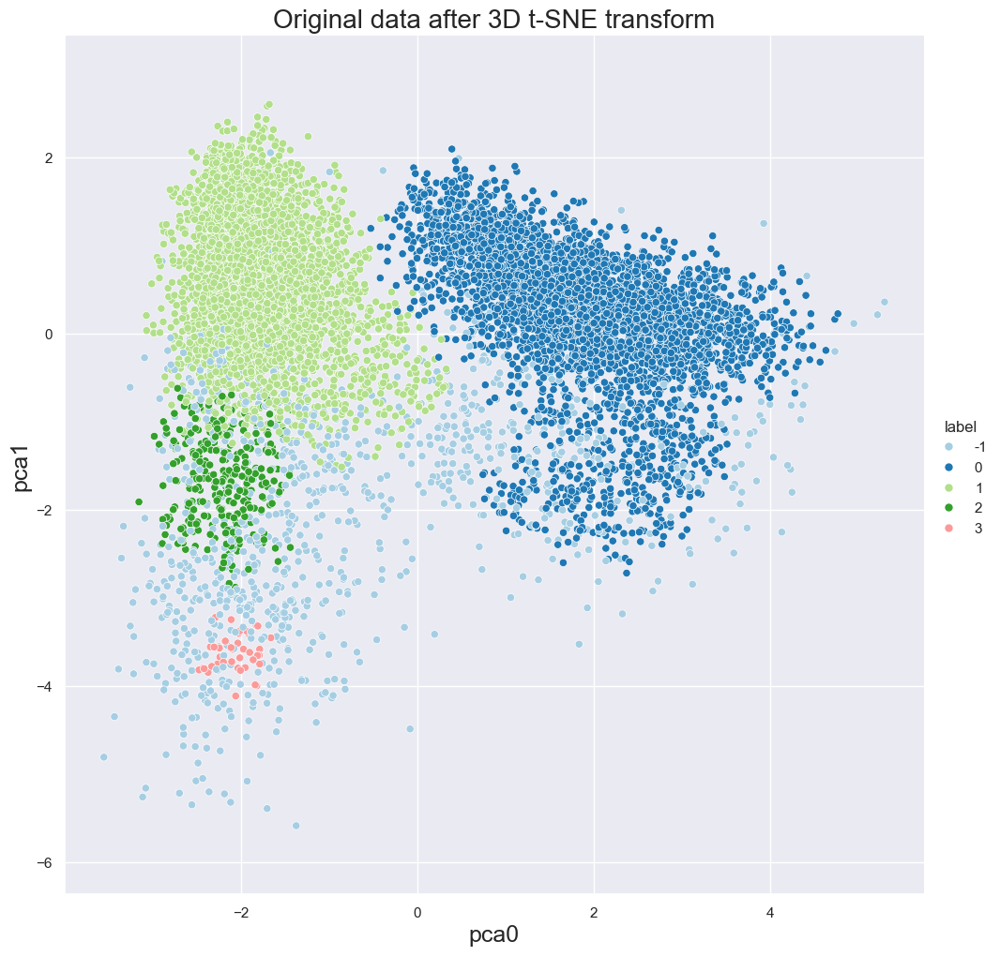

In [59]:
epsis = [0.2,0.28,0.29,0.3,0.31,0.32,0.33,0.34,0.35,0.37,0.39,0.4,0.41,0.42,0.43,0.44,0.45,0.46,0.47,0.48]
data_epsis = []
min_samples = n_samples

#epsis = [0.2,0.28,0.29,0.3,0.31,0.32,0.33,0.34,0.35,0.37,0.39,0.4]
aux_labels = {}
for epsilon in epsis:
  aux_labels[epsilon] = ApplyDBScanToData (df_samples_PCA_3D, epsilon, min_samples=min_samples)

epsilon = 0.42
labels_PCA_3D = aux_labels[epsilon]
Plot2D_WithLabels (df_samples_PCA_3D, labels_PCA_3D, title, axes_PCA_3D, palette="Paired")